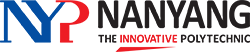

# IT3311 Assignment - Task 1: Text Classification

You are required to build a text classification model to predict the video category based on its title and transcript.

**Tasks:**

1. **Data Understanding**: Examine the dataset
2. **Data Preparation**: Prepares the data and all necessary preprocessing tasks
3. **Modelling**: Use different text representation and algorithms
4. **Evaluation**: Evaluates results from the algorithms and select the best model

**Done by: V Varsha 203011T**

## 1. Import libraries and download the packages

In [4]:
import pandas as pd
import seaborn as sns
from matplotlib import pyplot as plt
import nltk
import string 
# from spellchecker import SpellChecker
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
import re 
nltk.download('stopword')
nltk.download('punkt')
nltk.download('wordnet')
from nltk.stem.wordnet import WordNetLemmatizer
from nltk.corpus import wordnet
lemmatizer = WordNetLemmatizer()
from string import digits
from gensim.models import Word2Vec
from sklearn.model_selection import train_test_split
from gensim.models.word2vec import Word2Vec
from gensim.models import KeyedVectors
import numpy as np
from sklearn.svm import SVC
from nltk.probability import FreqDist
from sklearn.ensemble import RandomForestClassifier
from sklearn.multioutput import MultiOutputClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report
from nltk.tokenize import word_tokenize 
from sklearn.ensemble import AdaBoostClassifier
from sklearn.metrics import plot_confusion_matrix
from sklearn.model_selection import cross_val_score,KFold
from sklearn.model_selection import GridSearchCV
from sklearn.naive_bayes import MultinomialNB
from nltk.util import ngrams
from collections import Counter
from wordcloud import WordCloud
import contractions
from sklearn.feature_extraction.text import TfidfVectorizer
import warnings
warnings.simplefilter("ignore")

[nltk_data] Error loading stopword: Package 'stopword' not found in
[nltk_data]     index
[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\varsh\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\varsh\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


## 2. Read & Display Data

In [118]:
data=pd.read_csv("videodata.csv")

In [106]:
data.head()

,Unnamed: 0,Id,Channel,Title,Category,Transcript
0,1,RN8yoi-e2yc,Mythical Kitchen,$420 Pizza Hut Stuffed Crust Pizza | Fancy Fas...,Food,"- Oh, that's dirty.\r\n- Wow! - Whoa.\r\n- You..."
1,2,IugcIAAZJ2M,Munchies,The Iconic $1 Pizza Slice of NYC | Street Food...,Food,if you want good pizza come to st marks it's t...
2,3,JiEO6F8i0eU,Parks and Recreation,Ron Swanson: The Papa of Pawnee | Parks and Re...,"Entertainment,Comedy",April where have you been over two phone calls...
3,5,0ZWGeidvrJw,Doctor Who,The Doctor Defeats the Abzorbaloff | Love and ...,Entertainment,"Oh, what's the matter?\r\nHave you given up so..."
4,6,YiEj9mrqTN0,A&E,Live PD: Most Viewed Moments from Walton Count...,News,[music playing] We'll be on Laverne Street. It...


## 3. Exploratory Data Analysis Before Data Preparation

### Define Function for Charts

In [18]:
def plot_cloud(wordcloud): #function to plot word cloud
    plt.figure(figsize=(40, 30))
    plt.imshow(wordcloud) 
    plt.axis("off")

def plot_histogram(hist_data,title):
    plt.hist(hist_data)
    plt.title("Distribution of {} Length".format(title))
    plt.show() 

In [10]:
print("The columns in the dataset are:", data.columns)

The columns in the dataset are: Index(['Unnamed: 0', 'Id', 'Channel', 'Title', 'Category', 'Transcript'], dtype='object')


### 3.1 Exploratory Data Analysis Before Data Preparation - Shape

There are 1589 rows and 6 columns in the dataset

In [28]:
print("The shape of the dataset is:",data.shape)

The shape of the dataset is: (1589, 5)


There are 1589 rows and 6 columns in the dataset

There is a column "Unamed:0" which does not contain any meaningful information. Hence it will be removed from the dataset during preprocessing

In [10]:
print("The columns in the dataset are:", data.columns)

The columns in the dataset are: Index(['Unnamed: 0', 'Id', 'Channel', 'Title', 'Category', 'Transcript'], dtype='object')


There is no nulls in the data. The data type is "object" for all the relevant coulmns

In [14]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1589 entries, 0 to 1588
Data columns (total 6 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   Unnamed: 0  1589 non-null   int64 
 1   Id          1589 non-null   object
 2   Channel     1589 non-null   object
 3   Title       1589 non-null   object
 4   Category    1589 non-null   object
 5   Transcript  1589 non-null   object
dtypes: int64(1), object(5)
memory usage: 74.6+ KB


### 3.2 Exploratory Data Analysis Before Data Preparation - Channels

There are 58 different channels and all channels have more than 20 videos except: VICE,SomeGoodNews,EpicNameBro     

In [29]:
print("No. of channels in dataset:",len(data["Channel"].value_counts()))
print("Channels & respective number of videos")
data["Channel"].value_counts()

No. of channels in dataset: 58
Channels & respective number of videos


jacksepticeye                      30
Brooklyn Nine-Nine                 30
Bon Appétit                        30
Hell's Kitchen                     30
Linus Tech Tips                    30
DRIVETRIBE                         30
LGR                                30
The Try Guys                       30
The Daily Show with Trevor Noah    30
The F Word                         30
The Office                         30
Key & Peele                        30
A&E                                30
videogamedunkey                    30
Parks and Recreation               30
BuzzFeedVideo                      29
TechLinked                         29
MrBeast                            29
Screen Junkies                     29
Coder Coder                        29
The Graham Norton Show             29
Top Gear                           29
Mythical Kitchen                   29
Gordon Ramsay                      29
Internet Historian                 29
Hardware Canucks                   29
Austin Evans

### 3.2 Exploratory Data Analysis Before Data Preparation - Category

There are 6 different categories in the dataset. However, some videos belong to 2 categories. Hence, the columns have to be separated in during preprocessing. Based on the chart, we can see that there are more videos that belong to a single category than multiple cateogries. Furthermore, "Comedy, Entertainment" and "Entertainment, Comedy" refer to the same category. However due the way it is written it is classified as different categories

In [31]:
print("No. of categories in dataset:",len(data["Category"].value_counts()))
print("Category & respective number of videos")
data["Category"].value_counts()

No. of categories in dataset: 11
Category & respective number of videos


Food                    281
VideoGames              265
Comedy                  227
Tech                    222
News                    218
Entertainment           114
Entertainment,Comedy     88
Comedy,Entertainment     88
Tech,Comedy              29
Tech,News                29
Food,Entertainment       28
Name: Category, dtype: int64

<AxesSubplot:xlabel='Category', ylabel='count'>

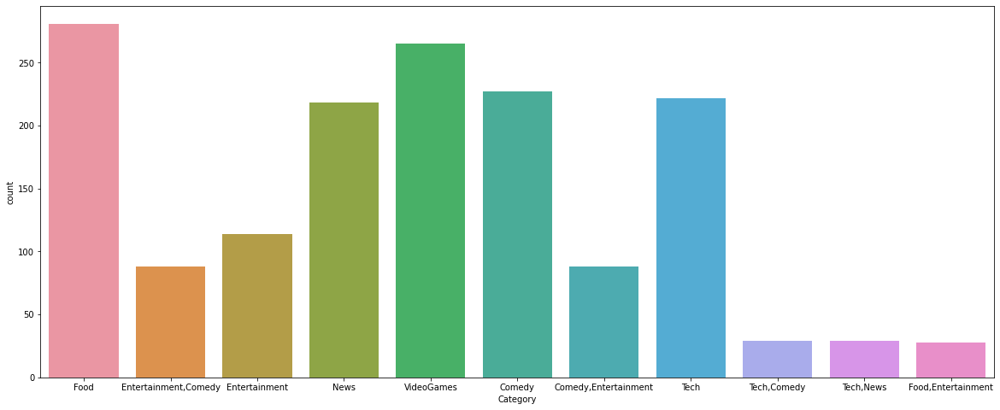

In [19]:
plt.figure(figsize=(20,8))
sns.countplot(data=data, x="Category")

### 3.3 Exploratory Data Analysis Before Data Preparation - Transcript & Title

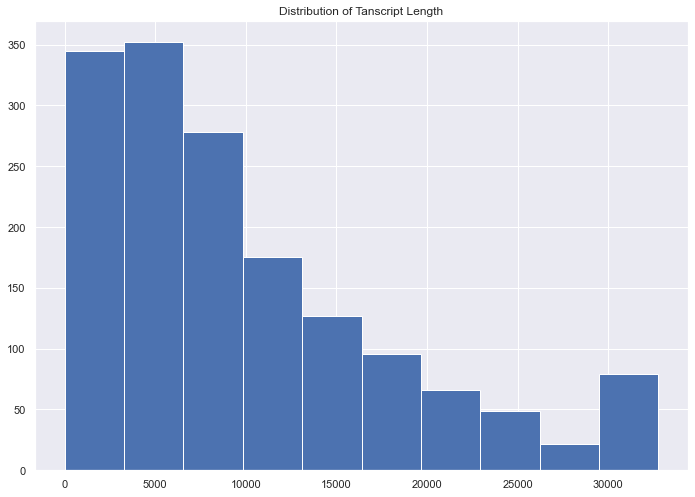

In [119]:
transcript_length = []
for i in range(len(data)):
    transcript_length.append(len(data["Transcript"][i]))
    
plot_histogram(transcript_length,"Tanscript")

The number of words in the transcripts range between 0 to 3250 words. Majority of the transcripts have up to 1000 words.

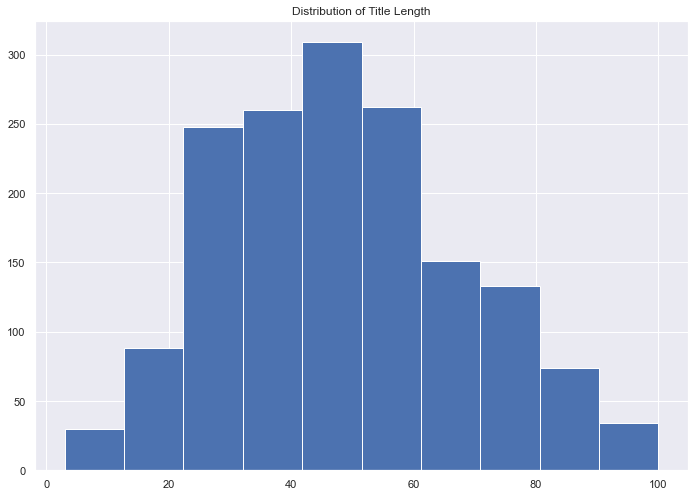

In [120]:
title_length = []
for i in range(len(data)):
    title_length.append(len(data["Title"][i]))
    
plot_histogram(title_length,"Title")

The number of words in the title range between slightly more than 0 to 100 words. Majority of the transcripts have words in the range 20 to 60 words.

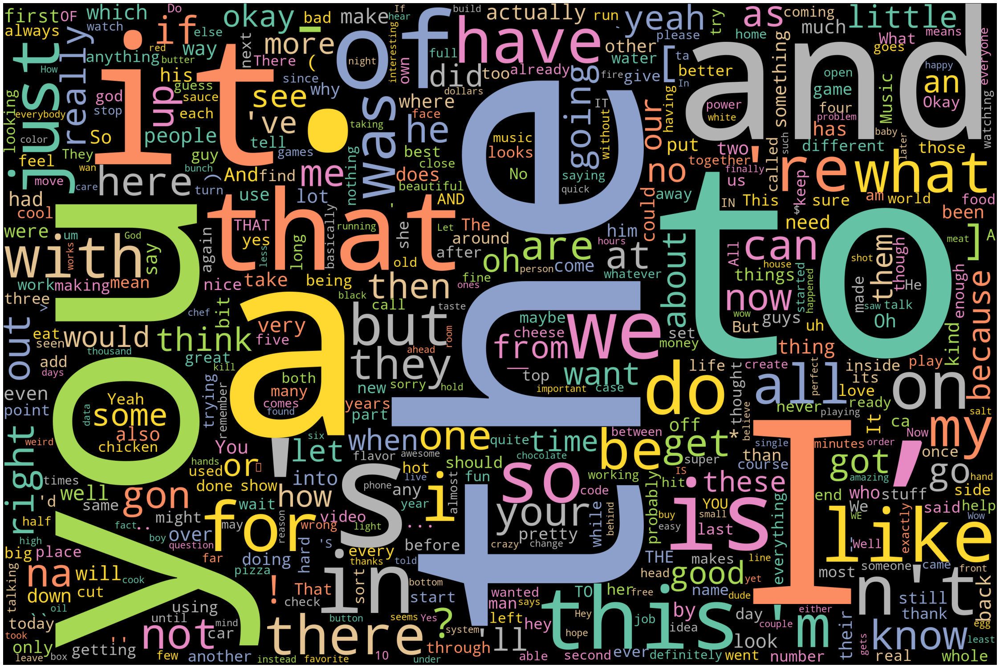

In [75]:
#tokenize words and visualize frquency through word cloud
all_uncleaned_transcript=[word for sent in data["Transcript"] for word in word_tokenize(sent)]
all_unclean_transcript_frequency = FreqDist(all_uncleaned_transcript)

wordcloud = WordCloud(width=3000, height=2000, colormap='Set2',collocations=False, max_words=500)
wordcloud.generate_from_frequencies(frequencies=all_unclean_transcript_frequency)
plot_cloud(wordcloud)

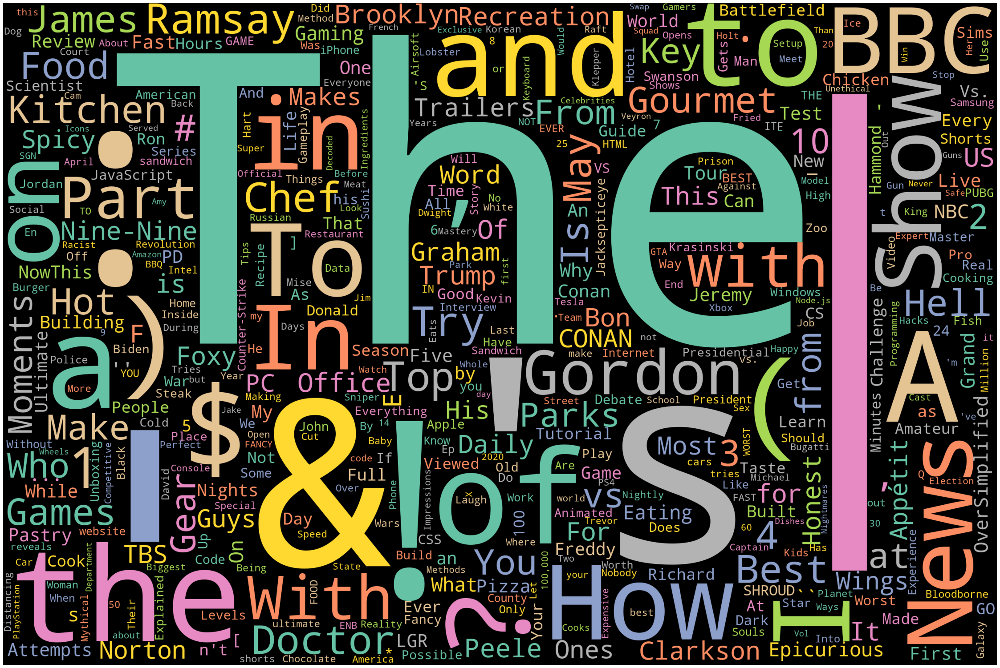

In [76]:
#tokenize words and visualize frquency through word cloud
all_uncleaned_title=[word for sent in data["Title"] for word in word_tokenize(sent)]
all_unclean_title_frequency = FreqDist(all_uncleaned_title)

wordcloud = WordCloud(width=3000, height=2000, colormap='Set2',collocations=False, max_words=500)
wordcloud.generate_from_frequencies(frequencies=all_unclean_title_frequency)
plot_cloud(wordcloud)

The "Transcript" and "Title" column contains raw textual data. Hence, it would require alot of preprocessing. Based on the word cloud generated, the larger words which appear more frequently, are common words like "the","you", "to", "that" and "and" and more. These are stops words which would not be useful for the text classification and must be removed. In general, the word cloud contains many general words.

There are also punctuations like "!", "?", ".", "$" and numbers present in the data. The text also has different sentence casings

When looking at the data through the csv file, there are also mispelt words as well as non ascii characters. These issues must be resolved in the data preparation stage in order to reduce the noise in the data for the modelling stage.

## 4. Data Preparation

### 4.1 Remove Unecessary Columns

In [35]:
del data["Unnamed: 0"]
del data["Channel"]
del data["Id"]

In [23]:
all_unclean_transcript_frequency = FreqDist(all_uncleaned_words)

The channel and Id column is uncessary for the prediction in the modelling stage
The "Unamed:0" column is an additional column which does not provide any information
Hence, these columns were removed

### 4.2 Check for Nulls

In [36]:
data.isnull().sum()

Id            0
Title         0
Category      0
Transcript    0
dtype: int64

There are no missing values in the dataset

### 4.3 Check for duplicates

In [37]:
print("Number of duplicated rows:",data.duplicated().sum())

Number of duplicated rows: 0


There are not duplicated rows as well

### 4.4 Merge Title and Transcript Columns
Since the objective is to use the title and transcript to predict the category of the video, I will be merging the columns as feature extraction will be performed later

In [38]:
#merge the columns into new column, "Text" and delete the "title" and "transcript" columns
data["Text"]= data["Title"]+data["Transcript"]
del data["Title"]
del data["Transcript"]

### 4.5 Clean "Text" column

In [39]:
spell = SpellChecker()
stop_words=set(stopwords.words("english"))

def expand_contractions_remove_stopwords_case_normalization(text):
    tokens = []
    text = text.split(text) #tokenization
    text = word.encode("ascii", "ignore") #remove non ascii characters
    text = tokens.decode()
    for word in text.split():
        tokens.append(contractions.fix(word)) #expand contractions
    tokens = [word.lower() for word in tokens if not word in stopwords.words()] #remove stopwords and case normalization
    return tokens

#function to perform POS tagging
#referece: https://www.youtube.com/watch?v=RIQIb0lt1p0
def get_wordnet_pos(word):
    tag = nltk.pos_tag([word])[0][1][0].upper()
    if tag=="J":
        return wordnet.ADJ
    elif tag=="N":
        return wordnet.NOUN
    elif tag=="V":
        return wordnet.VERB
    elif tag=="R":
        return wordnet.ADV
    else:
        return None
    
# function to perform lemmatization
def lemmatize(tokens):
    lem=[]
    for word in tokens:
        tag= get_wordnet_pos(word)
        if tag == None:
            lem.append(word)
        else:
            lem_word=lemmatizer.lemmatize(word,tag)
            lem.append(lem_word)
    return lem

def clean(text):
    filtered_sent=[]
    tokens = expand_contractions_remove_stopwords_case_normalization(text) #expand contractions
    for word in tokens: 
        word=spell.correction(word) #spelling normalization
        word = word.translate(str.maketrans('', '', string.digits)) #remove digits
        word = word.translate(str.maketrans('', '', string.punctuation)) #remove punctuations
        if len(word) >= 2: #if length of word is more than or equal to 2, keep word 
            filtered_sent.append(word)
    lemmatized_tokens = lemmatize(filtered_sent) #call lemmatization function
    text_cleaned = ' '.join(w for w in lemmatized_tokens if w not in "'[]") #join tokens back into string
    return text_cleaned tokens


In [40]:
data['Text'] = data['Text'].apply(clean)

The following steps were performed to clean the textual data:
<ol>
    <li> Remove non-ascii characters: Non-ascii character are characters that are not encoded in UTF-8,
        which is a standard Unicode encoding that supports non-ASCII characters. Python requires explicit encoding and decoding
        of strings into Unicode. (eg:Æ æ,À,Ä) </li> <br>
    <li> Expand contractions: expand contractions such as "I'll" "It's" and more. If these are not expanded and the punctuation
         is removed, the words will not be treated as stopwords </li> <br>
    <li> Remove stop words: Remove extremely common words which do not have much predictive value </li> <br>
    <li> Case Normalization: standardize words as words with different casings will be treated differently during feature
        extraction. For instance,"Apple" and "apple" are not the same. </li> <br>
    <li> Spelling normalization: Correct mispelled words. During feature extraction, words that are spelt differently will be
        considered as different words. Hence, it is important to correct all the mispelled words as it would improve the
        performance of the model</li><br>
    <li> Remove punctuations, numbers: these are noise that will affect the models' performance </li> <br>
    <li> Lemmatization with POS tagging: Lemmatization is the process of reducing a word to its root form of the related word
          in the dictionary. Part of Speech tagging will enhance the result of the lemmatization as it specifies the
        grammatical category the word belongs to</li> <br>
    </ol>

### 4.6 Split Categories

Individual functions were created to indicate if video belongs to respective category. If video belongs to category "1" will be stated as the value. If the video does not exist, "0" will be stated.

In [46]:
def category_food_labels(category):
    if "Food" in category:
        return 1
    else:
        return 0

def category_entertainment_labels(category):
    if "Entertainment" in category:
        return 1
    else:
        return 0

def category_comedy_labels(category):
    if "Comedy" in category:
        return 1
    else:
        return 0

def category_news_labels(category):
    if "News" in category:
        return 1
    else:
        return 0

def category_videogame_labels(category):
    if "VideoGames" in category:
        return 1
    else:
        return 0

    
def category_tech_labels(category):
    if "Tech" in category:
        return 1
    else:
        return 0

In [47]:
data["Food"]= data['Category'].apply(category_food_labels)
data["Entertainment"]= data['Category'].apply(category_entertainment_labels)
data["Comedy"]= data['Category'].apply(category_comedy_labels)
data["News"]= data['Category'].apply(category_news_labels)
data["VideoGames"]= data['Category'].apply(category_videogame_labels)
data["Tech"]= data['Category'].apply(category_tech_labels)

As this a multi output classification problem, each category should have a one hot encoded column which states if the video belongs to the category.

## 5. Further Data Exploration

This is the dataset after cleaning. There is only the cleaned text column and the categories 

In [53]:
data = pd.read_csv("videodataclean4.csv")

In [122]:
data.head()

,Text,Food,Entertainment,Comedy,News,VideoGames,Tech
0,pizza hut stuff crust pizza fancy fast food my...,1,0,0,0,0,0
1,the iconic pizza slice nyc street food iconsif...,1,0,0,0,0,0
2,ron swanson papa pawnee park recreationapril p...,0,1,1,0,0,0
3,the doctor defeat abzorbaloff love monster doc...,0,1,0,0,0,0
4,live view moment walton county aemusic play we...,0,0,0,1,0,0


### 5.1 Further Data Exploration - General Analysis

#### Define Functions

In [41]:
#reference: https://www.kaggle.com/code/boldy717/textual-data-exploration-with-n-grams/notebook
# functions to extract n grams
def textNgrams(texts, size):
    all_ngrams = []
    for text in texts:
        tokens = text.split()
        if len(tokens) <= size:
            continue
        else:
            output = list(ngrams(tokens, size))
        for ngram in output:
            all_ngrams.append(" ".join(ngram))
    count_ngram = Counter()
    for word in all_ngrams:
        count_ngram[word] += 1
    df_ngram = pd.DataFrame.from_dict(count_ngram, orient='index').reset_index()
    df_ngram = df_ngram.rename(columns={'index':'words', 0:'count'})
    df_ngram = df_ngram.sort_values(by='count', ascending=False)
    df_ngram = df_ngram.head(15)
    df_ngram = df_ngram.sort_values(by='count')
    return(df_ngram)

# functions to plot n grams charts
def plotNgrams(texts):
    unigrams = textNgrams(texts, 1)
    bigrams = textNgrams(texts, 2)
    trigrams = textNgrams(texts, 3)
    
    # Set plot figure size
    fig = plt.figure(figsize = (20, 7))
    plt.subplots_adjust(wspace=.5)

    ax = fig.add_subplot(131)
    ax.barh(np.arange(len(unigrams['words'])), unigrams['count'], align='center', alpha=0.7, color="blue")
    ax.set_title('Unigrams')
    plt.yticks(np.arange(len(unigrams['words'])), unigrams['words'])
    plt.xlabel('Count')

    ax2 = fig.add_subplot(132)
    ax2.barh(np.arange(len(bigrams['words'])), bigrams['count'], align='center', alpha=0.7, color="orange")
    ax2.set_title('Bigrams')
    plt.yticks(np.arange(len(bigrams['words'])), bigrams['words'])
    plt.xlabel('Count')

    ax3 = fig.add_subplot(133)
    ax3.barh(np.arange(len(trigrams['words'])), trigrams['count'], align='center', alpha=0.7,color="purple")
    ax3.set_title('Trigrams')
    plt.yticks(np.arange(len(trigrams['words'])), trigrams['words'])
    plt.xlabel('Count')
    plt.show()   
    
def plot_histogram_unique_words(data,title):
    data_copy = data.copy()
    data_copy['count_unique_word']=data_copy["Text"].apply(lambda x: len(set(str(x).split())))
    sns.histplot(data_copy['count_unique_word'], bins=15,kde=True)
    plt.title("No. of Unique Words in {} Category".format(title))
    plt.show() 

#### 5.1.1 Further Data Exploration - General Analysis: No. of videos in each category

In [69]:
print(data["Food"].value_counts())
print("\n")
print(data["Entertainment"].value_counts())
print("\n")
print(data["Comedy"].value_counts())
print("\n")
print(data["News"].value_counts())
print("\n")
print(data["VideoGames"].value_counts())
print("\n")
print(data["Tech"].value_counts())

0    1226
1     293
Name: Food, dtype: int64


0    1205
1     314
Name: Entertainment, dtype: int64


0    1098
1     421
Name: Comedy, dtype: int64


0    1287
1     232
Name: News, dtype: int64


0    1262
1     257
Name: VideoGames, dtype: int64


0    1256
1     263
Name: Tech, dtype: int64


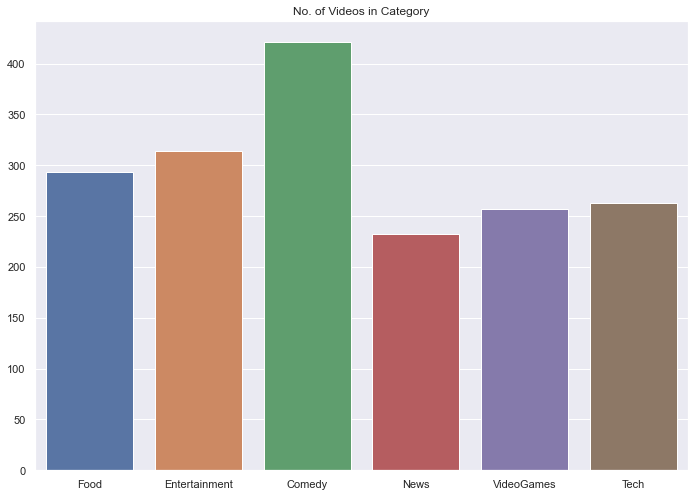

In [72]:
x = ['Food', 'Entertainment', 'Comedy',"News","VideoGames","Tech"]
y = [293,314,421,232,257,263]

sns.set(rc={'figure.figsize':(11.7,8.27)})
sns.barplot(x, y).set(title='No. of Videos in Category')
plt.show()

The chart above, shows that the classes in the dataset are not balanced. The class "comedy" has the highest number of videos while "News" has the lowest. The class "Comedy" has almost 1.5 times as many videos compared to other classes. However, all classes has more than 200 videos.

#### 5.1.1 Further Data Exploration - General Analysis: Text Length Distribution

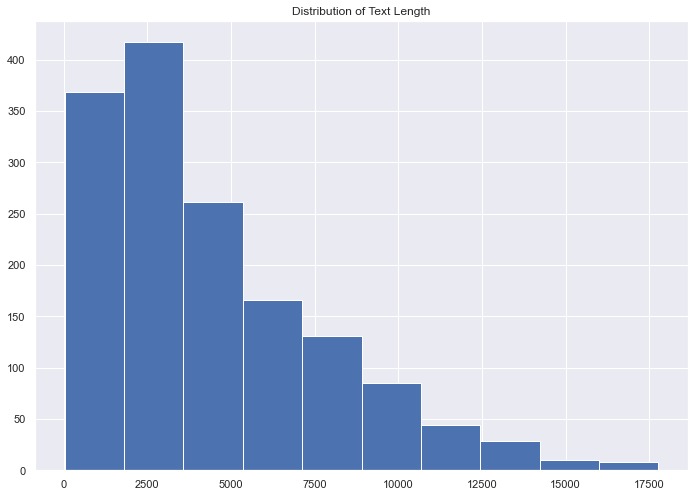

In [123]:
text_length = []
for i in range(len(data)):
    text_length.append(len(data["Text"][i]))
    
plot_histogram(text_length,"Text")

The overall length of text is in the range 0 to 17500 words. After preprocessing, the length of the text have reduced by slightly less than half. Majority of the texts' length is between, 0 to 5000. The distribution is skewed to the left

#### 5.1.2 Further Data Exploration - General Analysis: Word Cloud

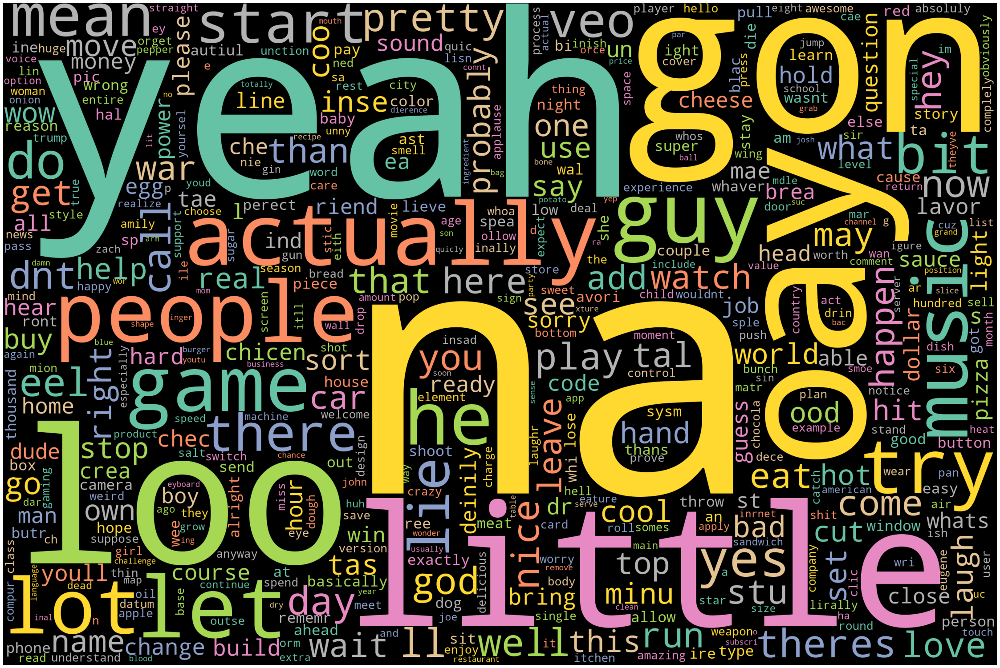

In [150]:
#tokenize words and visualize frquency through word cloud
all_cleaned_words=[word for sent in data["Text"] for word in word_tokenize(sent)]
all_cleaned_words_frequency = FreqDist(all_cleaned_words)

wordcloud = WordCloud(width=3000, height=2000, colormap='Set2',collocations=False, max_words=500)
wordcloud.generate_from_frequencies(frequencies=all_cleaned_words_frequency)
plot_cloud(wordcloud)

Based on the above word cloud, we can see that the text is much cleaner. Since this is the overall word cloud there are many general words. However, these words provide meaningful information. Hence, I will be diving into each category to analyse what words are in them.

#### 5.1.3 Further Data Exploration - General Analysis: N-grams

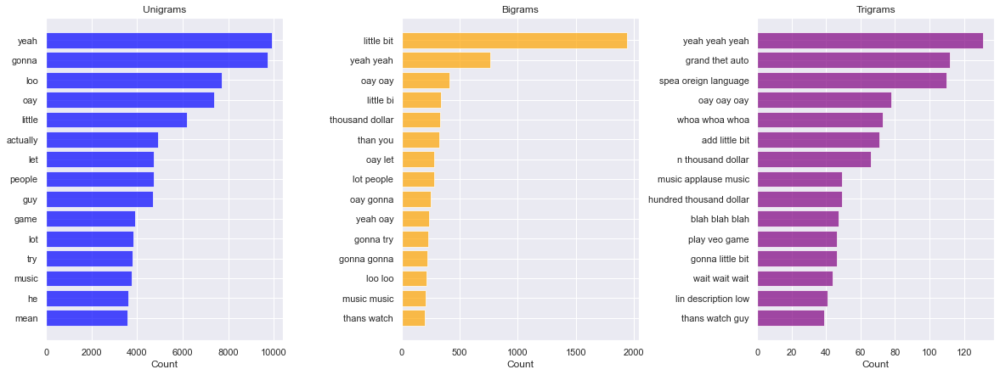

In [159]:
plotNgrams(data['Text'])

The chart above illustrates the the top 20 unigram, bigram and trigram respectively.
The unigram charts have many words that appear frequently. The top 20 unigrams appears in the text at least 3000 times.

The bigram chart shows that the bigram "little bit" is greatly mentioned as it appears around 2000 in the text. Apart from "little bit" and "yeah yeah", the other bigrams appear less than 500 times in the text

The most common trigram is "yeah yeah yeah". It appears 130 times in the text. This suggests that the word "yeah" appears frequently in the overall text and we can observe this in the word cloud above as well. The other trigrams appears less than 100 times in the text. This suggests that trigrams may provide much predictive value as compared to unigrams and trigrams. However, to be more sure, I will explore the trigrams in each class as well.

### 5.2 Further Data Exploration - Category Analysis

#### 5.2.1 Further Data Exploration - Category Analysis: Food

In [9]:
food_data = data[data.Food == 1]

##### 5.2.1.1 Further Data Exploration - Category Analysis: Food - Length of Text

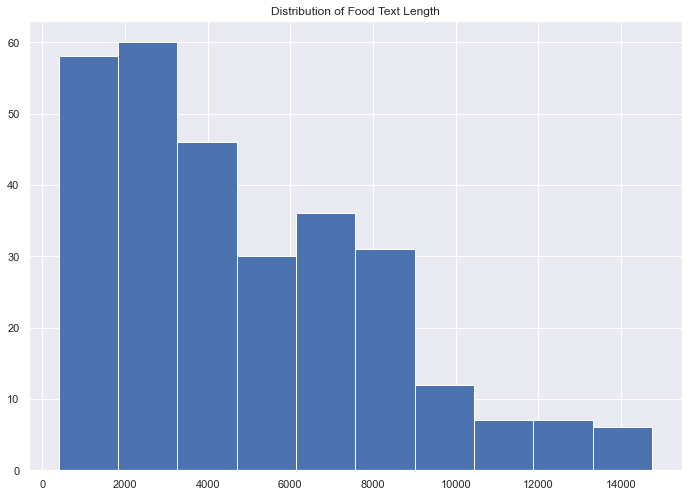

In [189]:
food_text_length = []
for i in food_data["Text"]:
    food_text_length.append(len(i))

    
plot_histogram(food_text_length,"Food Text")

The  length of texts in the food category is in the range is sligtly more than 0 to 15000 words. Majority of the text length is between 0 to 5000 words. The histogram is left skewed

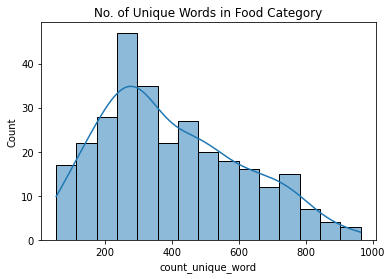

In [42]:
plot_histogram_unique_words(food_data,"Food")

The number of unique words in the food category ranges from around 50 to slightly less than 1000. Many of the videos in the food category has 200-400 unique words. However, most videos have more than 400 unique words The distribution is skewed to the left

##### 5.2.1.1 Further Data Exploration - Category Analysis: Food - Word Cloud

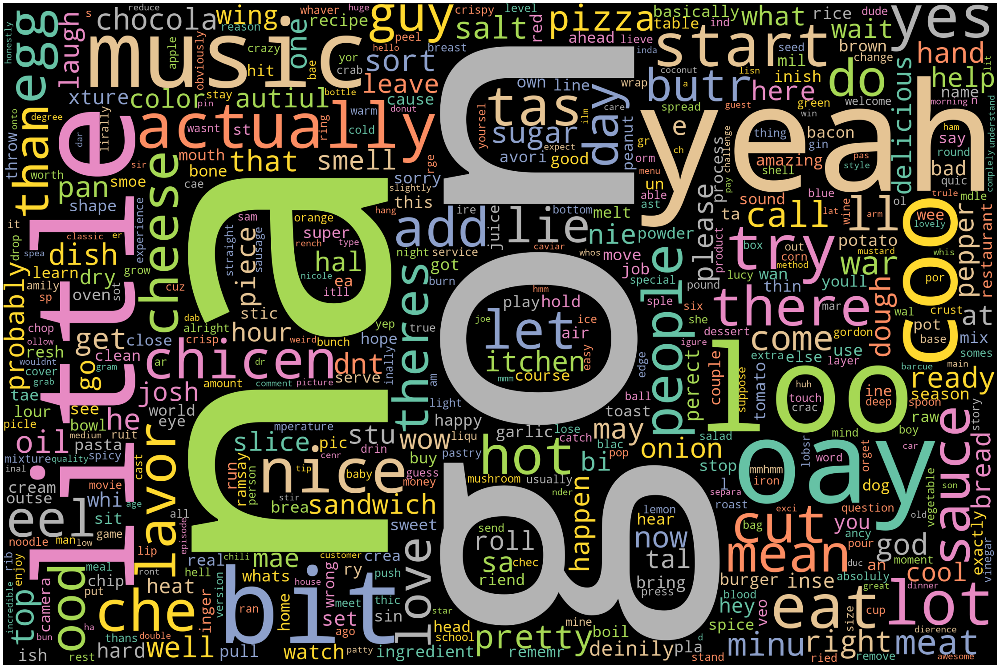

In [192]:
#tokenize words and visualize frquency through word cloud
food_words=[word for sent in food_data["Text"] for word in word_tokenize(sent)]
food_words_freq = FreqDist(food_words)

wordcloud = WordCloud(width=3000, height=2000, colormap='Set2',collocations=False, max_words=500)
wordcloud.generate_from_frequencies(frequencies=food_words_freq)
plot_cloud(wordcloud)

The word cloud shows that there are many words related to food items such as "eel", "pizza", "meat", "sauce", "egg" and more.
There are also words related to food such as "eat", "piece", "cut", "hot". These words would distinguish the food category from other categories. 

##### 5.2.1.1 Further Data Exploration - Category Analysis: Food - N Gram 

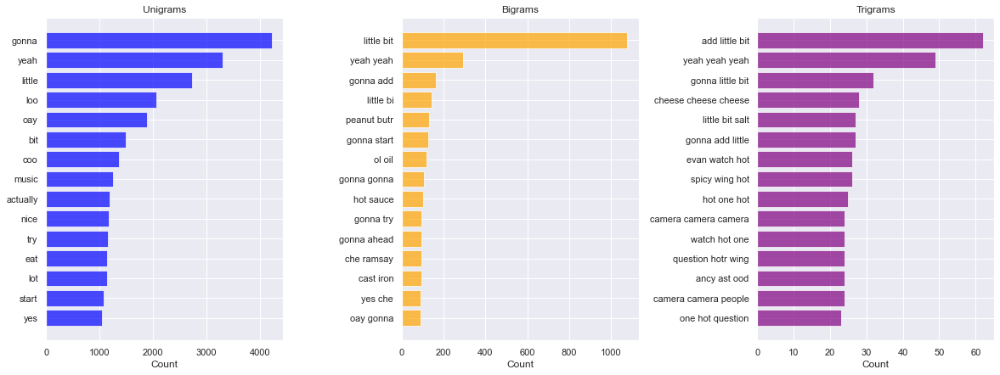

In [190]:
plotNgrams(food_data['Text'])

The top 20 unigrams does not provide much insight into the food category as it lacks words related to food. However, the bigrams and trigrams include words about food such as "hot sauce" and "cheese". Words like "yes chef" refer to "yes chef" and "little bit" could refer to adding more ingredients many videos are from "Hells Kitchen" which is a cooking show. Hence, there are words like "camera" in the trigrams. 

However, the bigram counts are less than 250 apart from "little bit". The trigram counts are also less than 50 apart from "add little bit". Hence, the trigrams may not be useful in predicting the food category.

#### 5.2.1 Further Data Exploration - Category Analysis: News

In [43]:
news_data = data[data.News == 1]

##### 5.2.2.1 Further Data Exploration - Category Analysis: News - Length of Text

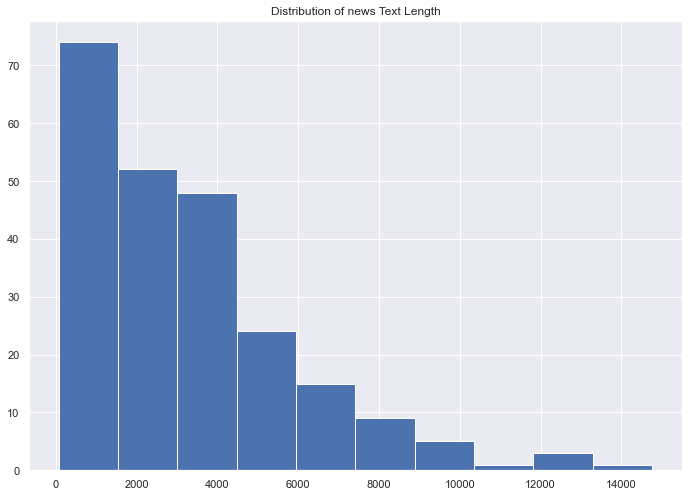

In [195]:
news_text_length = []
for i in news_data["Text"]:
    news_text_length.append(len(i))

plot_histogram(news_text_length,"news Text")

The  length of texts in the news category is in the range is sligtly more than 0 to 16000 words. Majority of the text length is between 0 to 5000 words

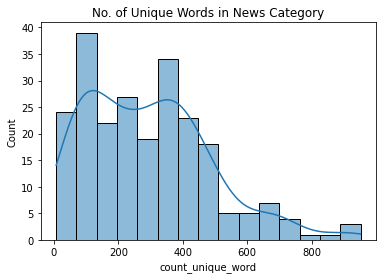

In [44]:
plot_histogram_unique_words(news_data,"News")

The number of unique words in the news category ranges between 0 to around 900. The distribution is skewed to the left. Most videos have more than less than 500 unique words

##### 5.2.2.2 Further Data Exploration - Category Analysis: News - Word Cloud

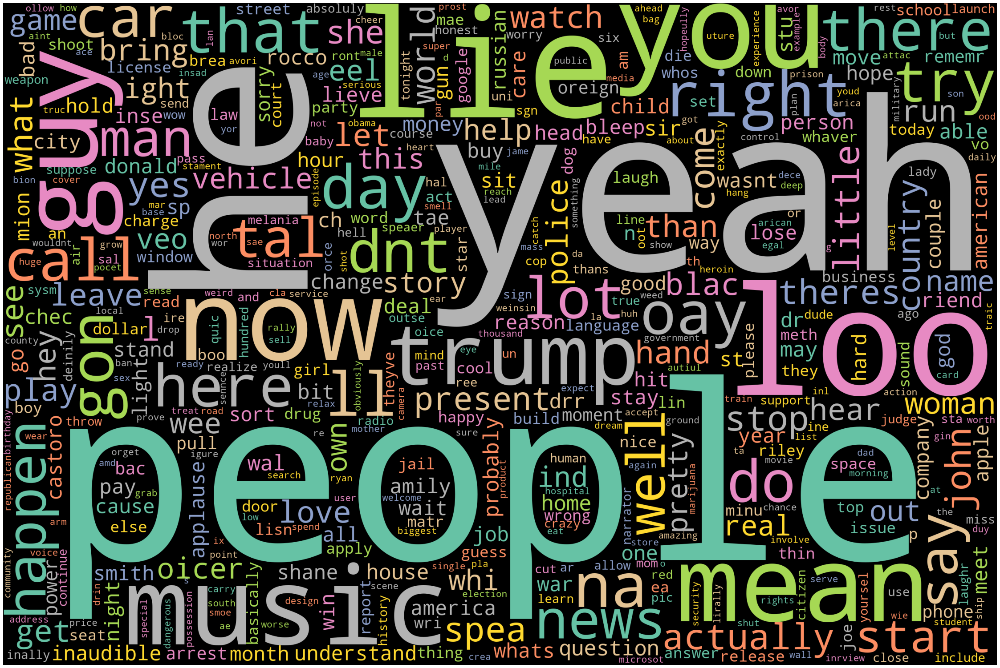

In [196]:
#tokenize words and visualize frquency through word cloud
news_words=[word for sent in news_data["Text"] for word in word_tokenize(sent)]
news_words_freq = FreqDist(news_words)

wordcloud = WordCloud(width=3000, height=2000, colormap='Set2',collocations=False, max_words=500)
wordcloud.generate_from_frequencies(frequencies=news_words_freq)
plot_cloud(wordcloud)

The word cloud does not include many words on specific news terms. However, there are many different words that related to what is spoken in a news channel such as names of people like "trump", "shane","smith". There are aslo words that refer to entities like "school", "vehcile", "car". There are also words related to time such as "day", "month", "time". There are also words that related to crimes wich are often mentioned in news such as "crime", "jail", "arrest". Hence, such words would be useful in the classification  of news category. However the words are very diverse.

##### 5.2.2.3 Further Data Exploration - Category Analysis: News - N Gram 

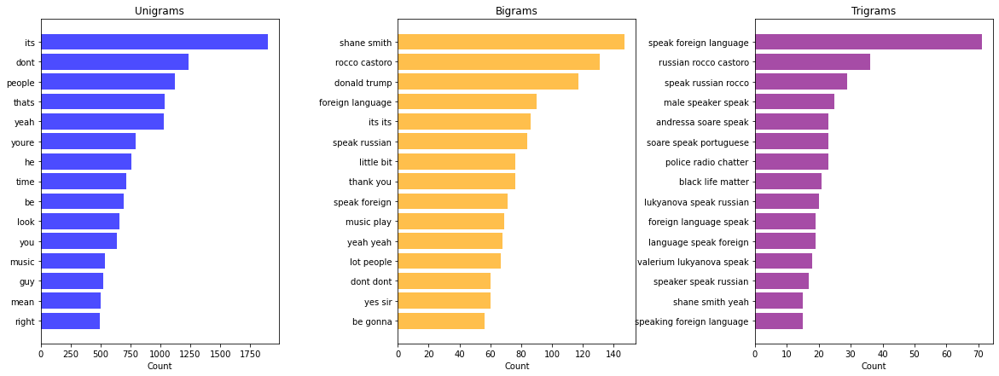

In [78]:
plotNgrams(news_data['Text'])

The top 20 unigrams does not provide much insight into the news category as it lacks words related to news. However, the bigrams and trigrams include words about that are likely to be mentioned in news videos such as "shane smith" who is a journalist. "donald trump" who was the ex president on USA and is a popular topic mentioned in the news. "star citizen" is also mentioned on the news if a good deed is performed by a citizen.  The trigram does not provide much insights and there are many words that does not make sense.

However, the bigram counts are less than 150. The trigram counts are also less than 40 apart from "spea oreign language". Hence, the trigrams may not be useful in predicting the news category.

#### 5.2.3 Further Data Exploration - Category Analysis: Comedy

In [45]:
comedy_data = data[data.Comedy == 1]

##### 5.2.3.1 Further Data Exploration - Category Analysis: Comedy - Length of Text

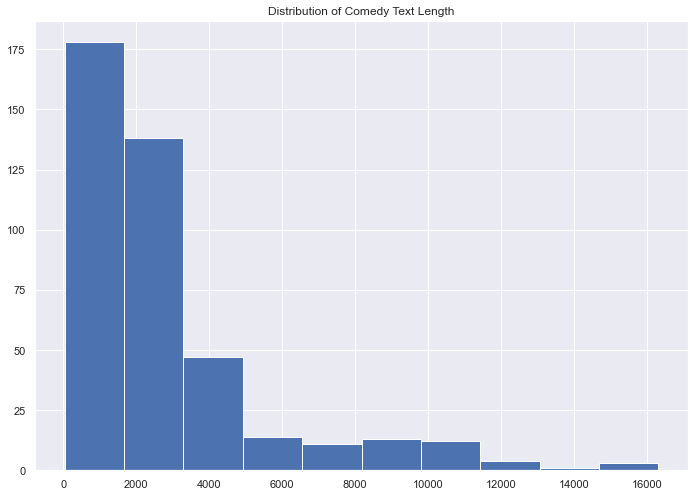

In [200]:
comedy_text_length = []
for i in comedy_data["Text"]:
    comedy_text_length.append(len(i))

plot_histogram(comedy_text_length,"Comedy Text")

The  length of texts in the comedy category is in the range is 0 to 16000 words. Majority of the text length is between 0 to 3000 words which is significantly lower compared to other categories. Furthermore, the comedy category has the most number of videos.

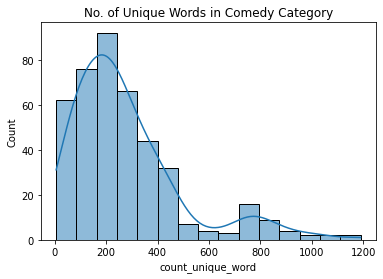

In [47]:
plot_histogram_unique_words(comedy_data,"Comedy")

The number of unique words in the comedy category ranges between 0 to around 1200. The distribution is skewed to the left. Most videos have more than less than 450 unique words

##### 5.2.3.2 Further Data Exploration - Category Analysis: Comedy - Word Cloud

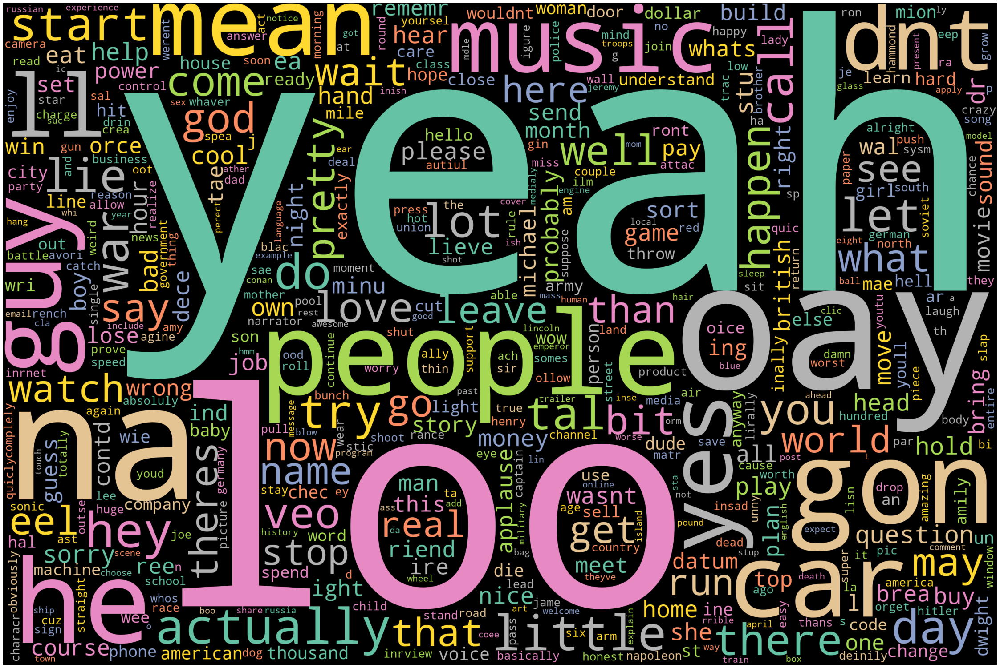

In [201]:
#tokenize words and visualize frquency through word cloud
comedy_words=[word for sent in comedy_data["Text"] for word in word_tokenize(sent)]
comedy_words_freq = FreqDist(comedy_words)

wordcloud = WordCloud(width=3000, height=2000, colormap='Set2',collocations=False, max_words=500)
wordcloud.generate_from_frequencies(frequencies=comedy_words_freq)
plot_cloud(wordcloud)

The word cloud does not include many words on specific comedy terms. The common words are "music", "yeah", "loo" and "car". The music refers to the music that is palyed in the background. This makes sense as comedy videos generally have more background sounds. There are words like "applause". In transcripts, the word "applause" is included when people calp. In general, comedy videos are skits or people sharing stories or their opinion on a certain topic. Hence, there are are terms specific to the comedy category.

##### 5.2.3.3 Further Data Exploration - Category Analysis: Comedy - N Gram 

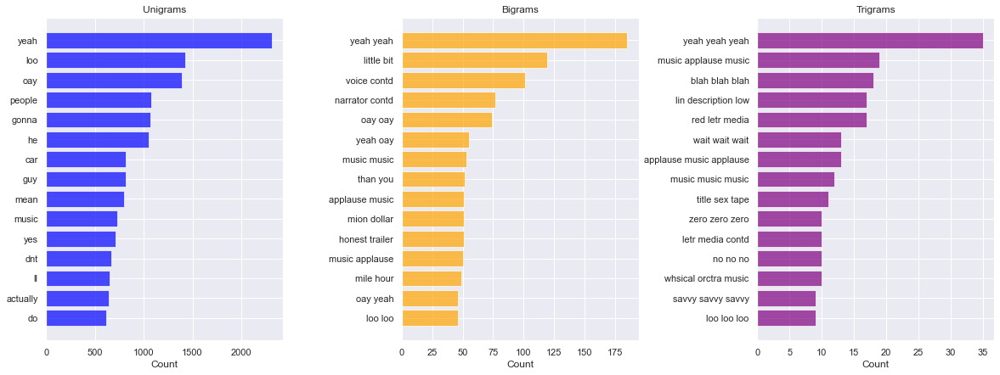

In [202]:
plotNgrams(comedy_data['Text'])

The top 20 unigrams does not provide much insight into the news category as it contaims many common words. However, the bigrams and trigrams include words about that are likely to be mentioned in comedy videos such as "music" and "applause"  which is likey recorded in transcripts of comedy videos. The bigram "than you" refers to "thank you" and it is also likely to be mentioned in comedy videos when comedians thank their augdience.

The trigams also include words with "music" and "applause". However the counts of trigrams are very low compared to other categories. Almost all trigrams appear 20 times only. Hence, the trigrams may not be useful in predicting the comedy category.

#### 5.2.4 Further Data Exploration - Category Analysis: Entertainment

In [48]:
entertainment_data = data[data.Entertainment == 1]

##### 5.2.4.1 Further Data Exploration - Category Analysis: Entertainment - Length of Text

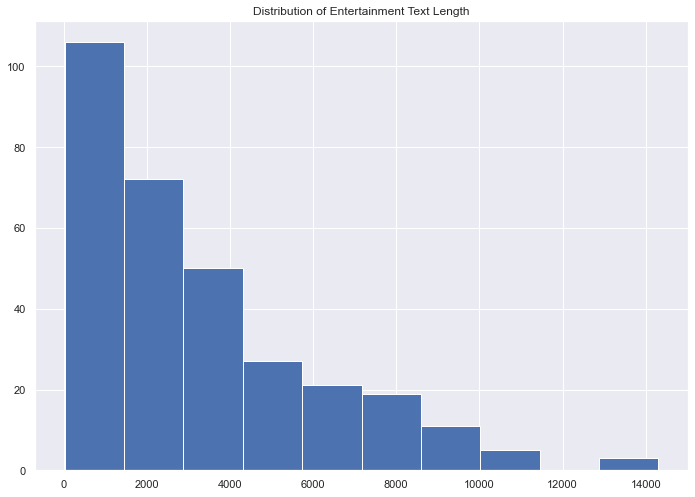

In [204]:
entertainment_text_length = []
for i in entertainment_data["Text"]:
    entertainment_text_length.append(len(i))

plot_histogram(entertainment_text_length,"Entertainment Text")

The  length of texts in the entertainment category is in the range is 0 to 14000 words. Majority of the text length is between 0 to 4000 words. The distribution is skewed to the left

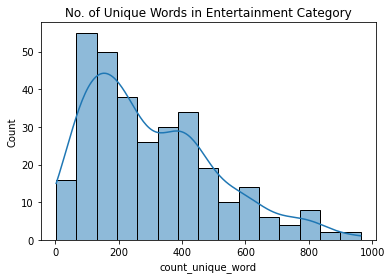

In [49]:
plot_histogram_unique_words(entertainment_data,"Entertainment")

The number of unique words in the food category ranges between 0 slightly less than 1000.The unique word count for most videos is between 50-450 words. The distribution is skewed to the left 

##### 5.2.4.2 Further Data Exploration - Category Analysis: Entertainment - Word Cloud

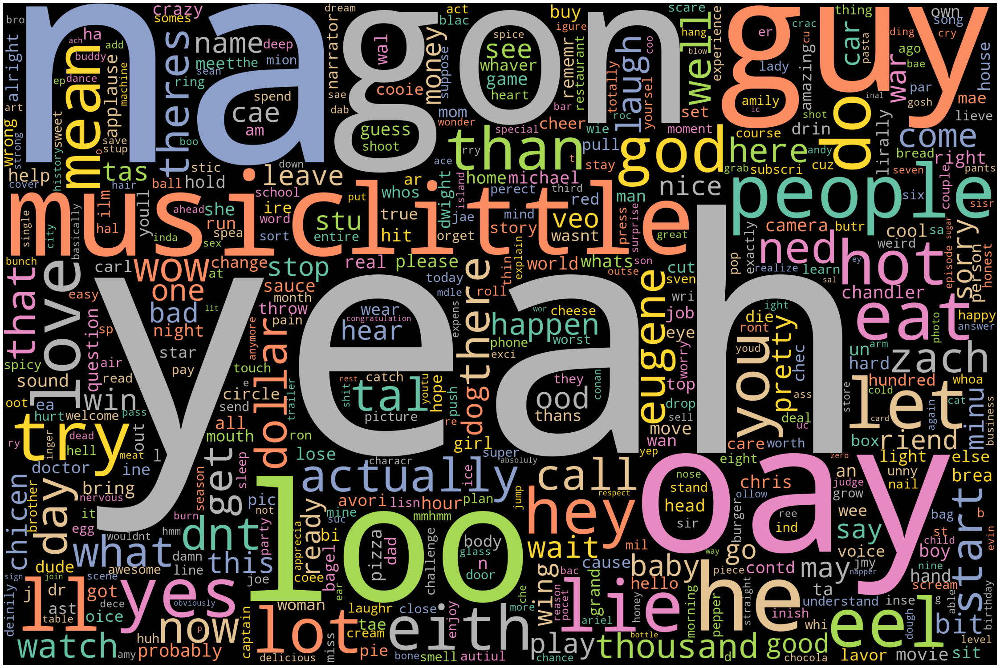

In [206]:
#tokenize words and visualize frquency through word cloud
ent_words=[word for sent in entertainment_data["Text"] for word in word_tokenize(sent)]
ent_words_freq = FreqDist(ent_words)

wordcloud = WordCloud(width=3000, height=2000, colormap='Set2',collocations=False, max_words=500)
wordcloud.generate_from_frequencies(frequencies=ent_words_freq)
plot_cloud(wordcloud)

The common n grams are similar to the n grams in the comedy and food category. These charts are a combination of the charts produced in the comedy and food category. Hence, there are terms related to both food and comedy. Similar to the previous charts, there are too few trigrams. Hence tri grams may not be necessary for feature extraction.

##### 5.2.4.3 Further Data Exploration - Category Analysis: Entertainment - N Gram 

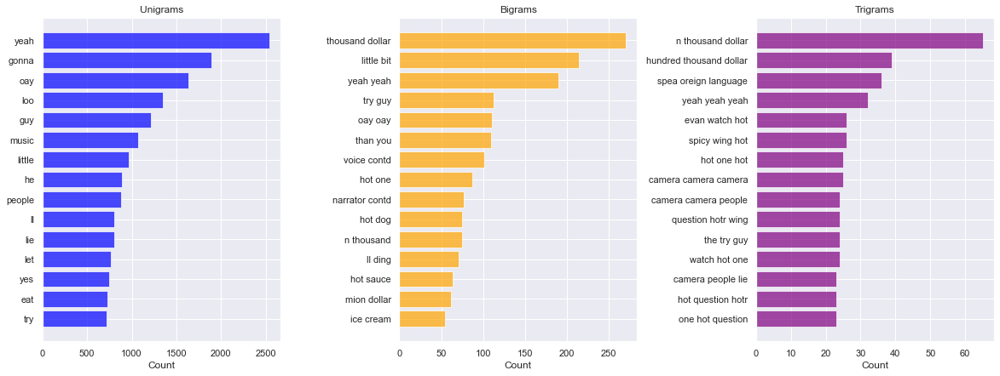

In [207]:
plotNgrams(entertainment_data['Text'])

The common n grams are similar to the n grams in the comedy and food category. These charts are a combination of the charts produced in the comedy and food category. Hence, there are terms related to both food and comedy. Similar to the previous charts, there are too few trigrams. Hence tri grams may not be necessary for feature extraction.

#### 5.2.5 Further Data Exploration - Category Analysis: Tech

In [61]:
tech_data = data[data.Tech == 1]

##### 5.2.5.1 Further Data Exploration - Category Analysis: Tech - Length of Text & Unique Words

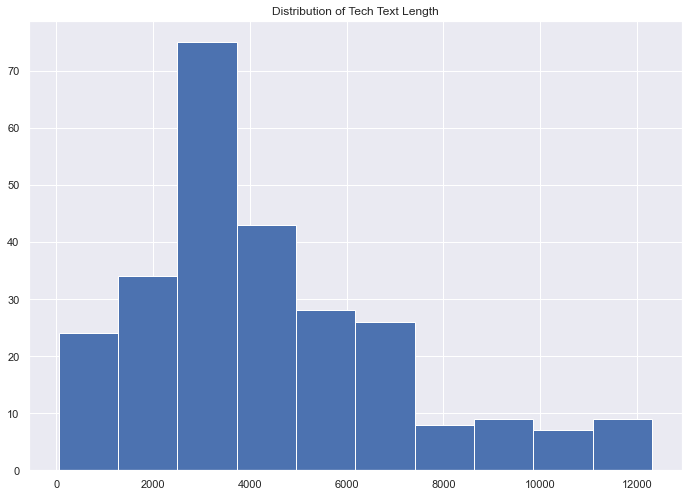

In [209]:
tech_text_length = []
for i in tech_data["Text"]:
    tech_text_length.append(len(i))

plot_histogram(tech_text_length,"Tech Text")

The  length of texts in the tech category is in the range is 0 to 12000 words. Majority of the text length is between 2000 to 5000 words. The distribution is skewed to the left

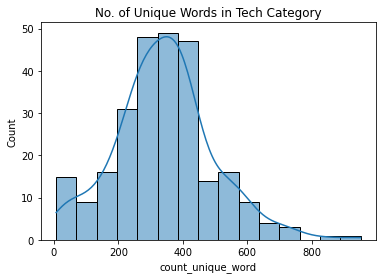

In [52]:
plot_histogram_unique_words(tech_data,"Tech")

The number of unique words in the tech category ranges between 0 to around 900.The unique word count for most videos is between 200 - 450 words. The distribution is skewed to the left 

##### 5.2.5.2 Further Data Exploration - Category Analysis: Tech - Word Cloud

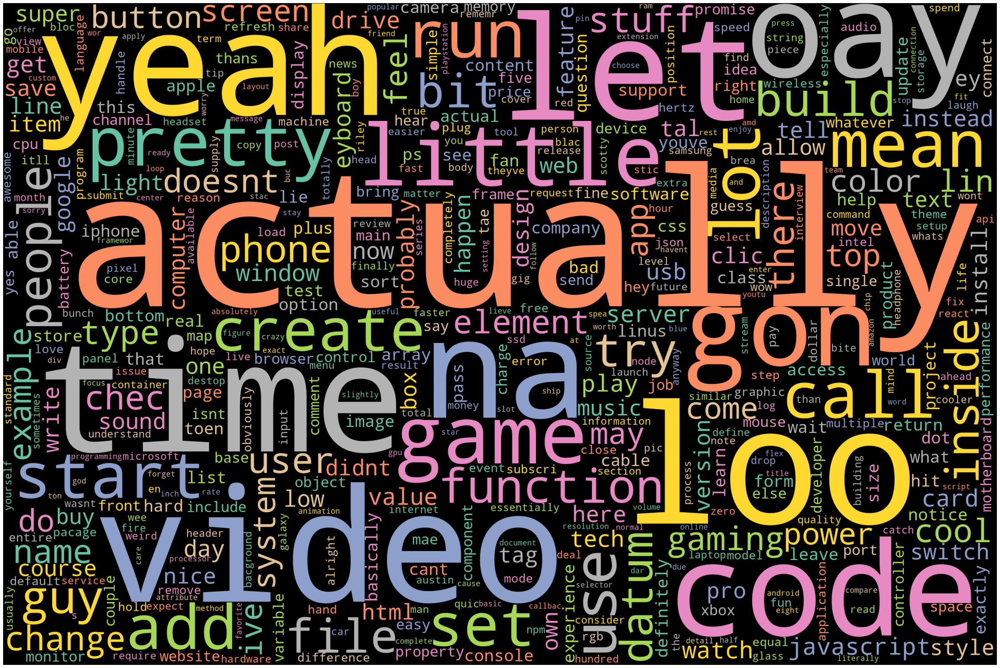

In [76]:
#tokenize words and visualize frquency through word cloud
tech_words=[word for sent in tech_data["Text"] for word in word_tokenize(sent)]
tech_words_freq = FreqDist(tech_words)

wordcloud = WordCloud(width=3000, height=2000, colormap='Set2',collocations=False, max_words=500)
wordcloud.generate_from_frequencies(frequencies=tech_words_freq)
plot_cloud(wordcloud)

The word cloud includes many terms about technology. These terms can also be further categorised. For instance, there are terms related to coding such as "code", "function" and "javascript". There also terms related to gaming such as "gaming", "play", "game", "console" and more. There are also terms on hardwares such as "servers", "motherboard","system" and more. This is a great word cloud and it suggests that the terms in text are very related to the tech category.

##### 5.2.5.3 Further Data Exploration - Category Analysis: Comedy - N Gram 

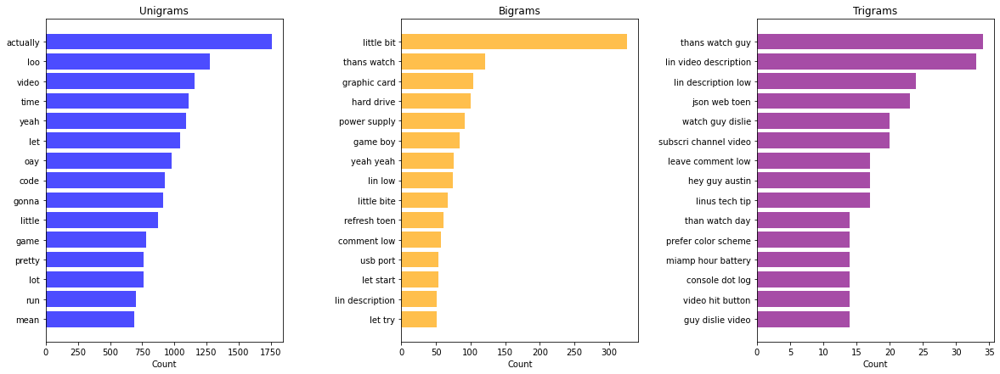

In [77]:
plotNgrams(tech_data['Text'])

Similar to the previous categories, the top 20 unigrams are general words and not many of them are specific to the tech category. In the bigrams we can see more words that are related to the tech category such as "graphics card", "hard drive", "game boy", "usb port". Compared to other catagories, the count of the bigrams are also higher. The trigrams contain terms which are more related to youtube vidoes such as "leave comment low" and "lin description low", "video hit button". All these are words YouTubers generally used in videos to encourage engagement with the viewers. The count of trigrams are also higher compared to other categories but low to be useful in feature extraction

#### 5.2.6 Further Data Exploration - Category Analysis: Video Games

In [82]:
vidgame_data = data[data.VideoGames == 1]

##### 5.2.5.1 Further Data Exploration - Category Analysis: Video Game - Length of Text

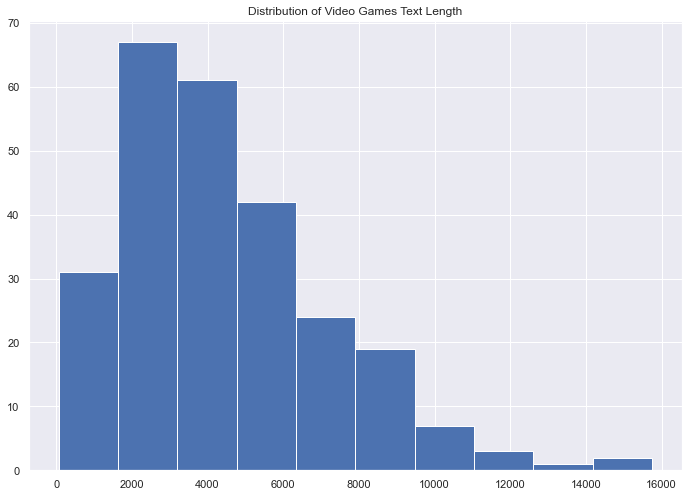

In [213]:
vidgame_text_length = []
for i in vidgame_data["Text"]:
    vidgame_text_length.append(len(i))

plot_histogram(vidgame_text_length,"Video Games Text")

The  length of texts in the video game category is in the range is 0 to 16000 words which is slightly more than other categories. Majority of the text length is between 2000 to 6000 words. The distribution is skewed to the left

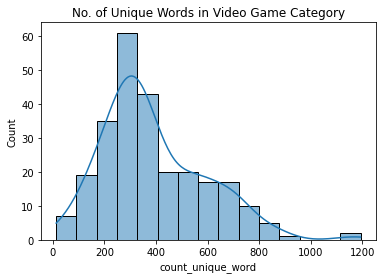

In [81]:
plot_histogram_unique_words(vidgame_data,"Video Game")

The number of unique words in the video game category ranges between 0 to around 1200.The unique word count for most videos is between 150 to 400 words. The distribution is skewed to the left 

##### 5.2.5.2 Further Data Exploration - Category Analysis: Video Games - Word Cloud

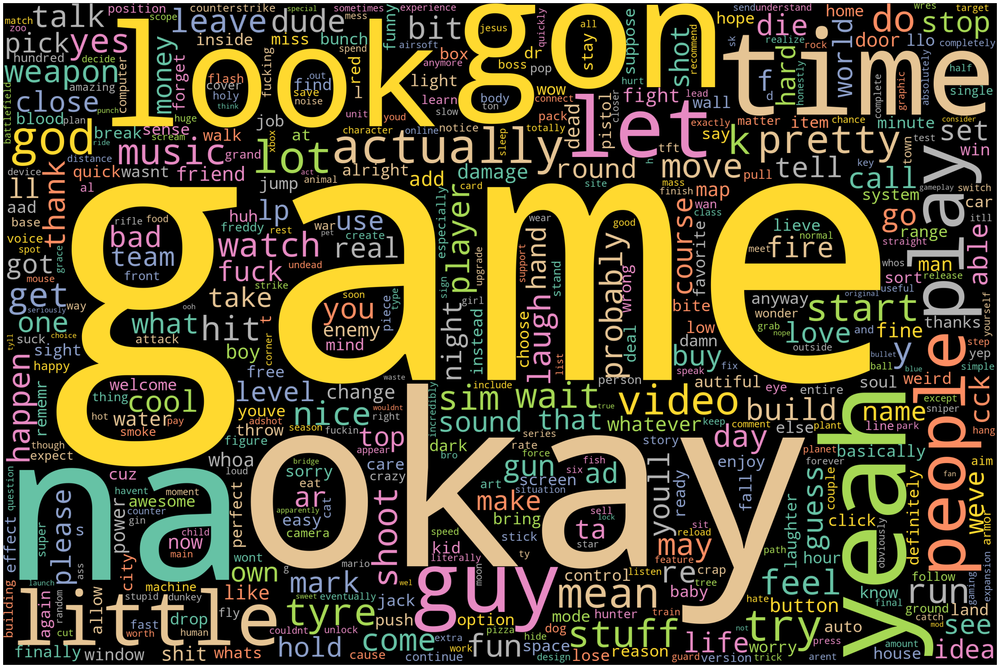

In [92]:
#tokenize words and visualize frquency through word cloud
vidgame_words=[word for sent in vidgame_data["Text"] for word in word_tokenize(sent)]
vidgame_words_freq = FreqDist(vidgame_words)

wordcloud = WordCloud(width=3000, height=2000, colormap='Set2',collocations=False, max_words=500)
wordcloud.generate_from_frequencies(frequencies=vidgame_words_freq)
plot_cloud(wordcloud)

The word cloud has terms related to video games such as "game", "computer", "play", "player". Hence, they  probably refers to videos on computer games. Some videos are about violent games as there are words like "weapon", "shoot", "die" and "gun". There are also gaming terms such as "damage", "counter strike" and "push". There are also words that describe annoyance such as "fuck", "shit" and "damn" as well as praises such as "awesome", "cool" and "perfect". The words in the word cloud accurate describrs would we would see in youtube video of gamers streaming themselves play

##### 5.2.5.3 Further Data Exploration - Category Analysis: Video Games - N Gram 

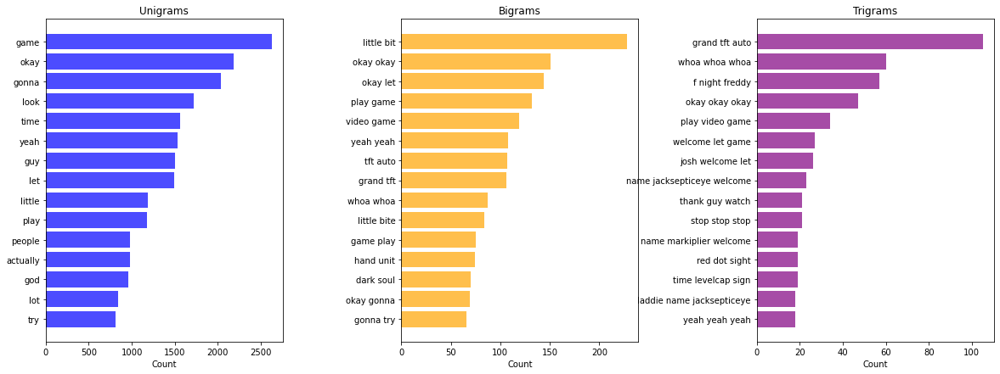

In [93]:
plotNgrams(vidgame_data['Text'])

Similar to the previous categories, the top 20 unigrams are general words and not many of them are specific to the tech category. In the bigrams we can see more words that are related to the tech category such as "video game", "play game", "game play". Compared to other catagories, the count of the bigrams are also higher. The trigrams contain terms which are more related gaming videos "play video game". There also the same words which are repeated thrice such as "whoa whoa whoa", "yeah yeah yeah" and "okay okay okay".  The count of trigrams are also higher compared to other categories but low to be useful in feature extraction

### 5.3 Further Data Exploration - Summary

Most categories have words unqiue to its category. The text from each category are very lengthy but many of these words are repeated. Each class has around only 1000 unique words. This would be good if the repeated words are not seen in other categories and are unique to the specific category. However, if they are seen in other categories, it may be diffiicult for the models to classify the texts accurately. Across all classes the unigrams (based on the word cloud) and bigrams provide useful information. Although the trigrams provide interesting insights, there count of the trigrams are very low. Hence, the trigrams will not be useful for the model to learn. The vidoes which appear in more than one category may be difficult to acurately classify as there is not many overlap in the words and it largely depends on the transcript of the video to determine if it belongs to one or both classes. 

## 6. Modelling

### 6.1 Define Functions for evaluvating models' performance using relevant metrics

In [8]:
#this function is used to evaluvate the model by printing the classification report
def evaluvate_model(model,X_test,y_test,model_name):
    model_predictions=model.predict(X_test)
    print("---------------------{} Classification Report--------------------- \n".format(model_name))
    print(classification_report(y_test,model_predictions)) #print classification report

In [12]:
#this function is used to cross validate the models' performance
kfolds = KFold(n_splits=10, random_state=42, shuffle=True)
def cross_validate_model(model,X,y,model_name):
    cross_val_f1_score=cross_val_score(model, X, y, cv=kfolds, scoring='f1_weighted') #cross validate f1-score
    cross_val_recall=cross_val_score(model, X, y, cv=kfolds, scoring='recall_weighted')  #cross validate accuracy
    cross_val_precision=cross_val_score(model, X, y, cv=kfolds, scoring='precision_weighted') #cross validate f1-score
    cross_val_accuracy=cross_val_score(model, X, y, cv=kfolds, scoring='accuracy')  #cross validate accuracy
    print("{} Mean Cross Validation F1-Score:{}".format(model_name,round(cross_val_f1_score.mean(),3)))
    print("{} Mean Cross Validation Recall:{}".format(model_name,round(cross_val_recall.mean(),3)))
    print("{} Mean Cross Validation Precision:{}".format(model_name,round(cross_val_precision.mean(),3)))
    print("{} Mean Cross Validation Accuracy:{}{}".format(model_name,round(cross_val_accuracy.mean()*100,3),"%"))

Cross-Validation is one of the most efficient ways of interpreting the model performance. It ensures that the model accurately fits the data and also checks for any overfitting. It is the process of assessing how the results of a model will generalize on unseen data. The kfold I chose was 10. Hence,the fitting procedure will be performed a total of ten times, with each fit being performed on a training set consisting of 90% of the total training set selected at random, with the remaining 10% used as a hold out set for validation.

source: https://towardsdatascience.com/micro-macro-weighted-averages-of-f1-score-clearly-explained-b603420b292f

The kcross validation is performed for f1_weighted, recall_weighted, precision_weighted and accracy score. The "weighted" is used the dataset is unbalanced. The f1/recall/precision weighted-averaged score is calculated by taking the mean of all per-class F1/recall/precision scores while considering each class's support. Support refers to the number of actual occurrences of the class in the dataset.

Source: https://www.researchgate.net/post/What-does-ten-times-ten-fold-cross-validation-of-data-set-mean-and-its-importance

In classification problems, the most important metrics are the precision,recall and f1-score. 
<ul>
    <li>Precision - A measure of how many of the positive predictions made are correctly </li>
    <li> Recall - A measure of how many of the positive cases the classifier correctly predicted, over all the positive cases in the data. </li>
    <li> F1-score - A measure combining both precision and recall. It is generally described as the harmonic mean of the two. </li>
    </ul>
  
Hence, I will be using these metrics as well as the classification report to evaluvate and compare the performance of the different  model

### 6.2 Models 

As this is a multi output classification problem, I have used the "MultiOutput Classifier" and indicated the models in the estimator hyper parameter. This enables the fitting of one classifier per target. It is a simple strategy for extending classifiers that do not natively support multi-target classification

In [13]:
nb = MultiOutputClassifier(estimator=MultinomialNB())
lrc = MultiOutputClassifier(estimator=LogisticRegression())
svc = MultiOutputClassifier(estimator=SVC())

The models used for the text classification are:
<ol>
    <li> <b>Naive Bayes:</b> This model models the distribution of documents in each class using a probabilistic model
        assuming that the distribution of different terms are independent from each other. The model assumes all the words in
        the text is independent Based on the labelled data, it will learn the probability of how many times the word “game”
        appears in Sports data divided by total number of words in the category. Although the assumption is wrong, it is
        generally well performing on real-world data. Furthermore, it is also proven to work well on text classification
        problems. <br><br>However, there are 3 different Naive Bayes models. I have chosen the Multinominal Naive Bayes instead
        of Bernoulli Naive Bayes and Gaussian Naive Bayes. <br>
    
    
<ul><li><i>Bernoulli Naive Bayes</i> is a binomial model that is useful if the feature vectors are binary. However, in the Word2Vec feature representation, the vectors are not binary </li> <br>

<li> <i>Gaussian Naive Bayes</li> assume that the features follow a gaussian distribution which means instead of discrete
counts, it has continuous features. However, our dataset does not contain continuous data. </li> <br><br>

<li><i>Multinomial Naive Bayes</i> is typically used for discrete counts but it also works
for fractional counts. Hence it is the most approporiate model to use for the text classification problem. </li></ul></li><br><br>
              
<li><b>Support Vector Machine</b> determines the best decision boundary between vectors that belong to a category and vectors that do not belong. Although it is originally for binary classification, it can be adapted to handle multi class classification. SVM separates labelled training data via a hyperplane that is maximally distant from the different categories.This optimally separating hyperplane in the feature space corresponds to a nonlinear decision boundary in the input space. The idea is, the data may not be linearly separable in our ‘n’ dimensional space but may be linearly separable in a higher dimensional space. Hence, it is able to work well with text data that is often sparse with high dimension. During the feature extraction I will be using TF-IDF and Bag of Words which will result in sparse data with high dimension. Hence, it would likely work well with it <br><br> Scikit learn offers 2 types of SVC algorithms: the regular SVC and Linear SVC. <br><br>I have chosen to use SVC. The Linear SVC algorithm is similar to the SVC algorithm but its its kernel parameter as "linear". Hence, during the hyper paramtere tuning I will be tuning to identify the best kernel for the SVC model. Thus, I will use the regular SVC first.<br><br></li>
    
    
<li><b> Logistic Regression </b> uses the weighted combination of the input features and passes them through a sigmoid function. Although it is for binary classfication, it can be adapted to suport multi class classification. Hence, for multi class classification it would use a softmax function instead of sigmoid. Furthermore, logistic regression is discriminatory. This means the algorithm is actually learning how to distinguish the classes from each other. Hence,It is good for text classification and it is known to be a great starter algorithm for text classification as it is efficient.</li><br><br>
 

References: https://scikit-learn.org/stable/modules/generated/sklearn.naive_bayes.MultinomialNB.html
        https://www.reddit.com/r/MachineLearning/comments/2uhhbh/difference_between_binomial_multinomial_and/
        https://monkeylearn.com/text-classification-support-vector-machines-svm/
        https://www.tutorialspoint.com/scikit_learn/scikit_learn_support_vector_machines.htm
        https://citeseerx.ist.psu.edu/viewdoc/download?doi=10.1.1.942.5312&rep=rep1&type=pdf


### 6.3 Text Representation

The text representations used are:
<ol>
    <li><b> Word2Vec </b> is a word embedding method. The Word2Vec model is trained such that probability of a word depends upon the neighbouring words. It uses a single hidden layer, fully connected neural networ. It is trained by maximizing the log likelihood of actual correct context vs a random context by using negative sampling. I will be using Googles' pretrained Word2Vec. It includes word vectors for a vocabulary of 3 million words and phrases that they trained on roughly 100 billion words from a Google News dataset. The vector length is 300 features. In our case where we do not have such a large corpus, using the pretrained model is likely to yield better results. Although I have not documented it in this notebook, while trying out the different text representation, I trained my own Word2Vec model. However, the results were significantly lower.</li><br><br>
    
<li> <b>Bag of Words</b> is a representation of text that describes the occurrence of words within a document. It is a simple yet effective method. It is based on the concept that documents are similar if they have similar content.</li><br><br>
    
<li> <b>TF-IDF</b> is a numerical statistic that reflects how important a word is to a document
in a corpus. TF, also known as Term Freuqncy, measures how often a term occurs in a document. The higher the TF, the more important the term is. IDF is Inverse Document Frequency. If a term occurs frequently, its importance decreases. When both are put together, a weight is assinged to a term in the document. The weight is heighest when it occurs too many times within a document. The weight is lower if it term occurs fewer times in a document, or occurs in many documents. The weight is lowest when the term occurs in every documents. </li>
    

In conclusion, all 3 text representation methods are commonly used techniques which are effective in representing the text. TF-IDF and BoW are able to represent the text in a vector space while Word2Vec will use averaging to obtain the mean of the vectors for each text.
    
    
    
References: https://medium.com/@zafaralibagh6/a-simple-word2vec-tutorial-61e64e38a6a1

### 6.4 Methodology

These will be the steps that I will follow to evaluvate the models:

<ol>
    <li> Perform feature extraction to obtain different text representations </li>
    <li> Train, test and evaluvate models on each text representation </li> 
    <li> Perform grid search with cross valiation on all models to identify the best parameters for all the models to tune the model and enhance its performance </li>
    <li> Revaluvate the model </li>
    <li> Analyse performance of all model - text represenation combinations to identify best performing model & its respective text represenation </li>
    
The grid search was performed with cross validation to ensures that the model accurately fits the data and also checks for any overfitting. It is the process of assessing how the results of a model will generalize on unseen data in order to determine the best set of hyper parameters for the model. The grid search will iteratively check each combination of hyper paramters and will return the ideal set of parameters based on the f1_weighted score.
    
Note: The grid search paramter grids for each model will be explained under 6.3. The same grid search parameter grid will be used for all other models. 
    


### 6.3 Word2Vec Embeddings

In [6]:
word2vec_pretrained_model = KeyedVectors.load_word2vec_format('GoogleNews-vectors-negative300.bin.gz', binary=True) #load pretrained model

In [16]:
word2vec_pretrained_vocab = word2vec_pretrained_model.key_to_index.keys() #create dictionary of words in pretrained model

In [17]:
def mean_vector_word2vec_pretrained(text):
    tokens = word_tokenize(text)
    tokens_filtered = [word for word in tokens if word in word2vec_pretrained_vocab] #filter off words that are not present in pretrained model vocab dictionary
    if len(tokens_filtered) >= 1:
        return np.mean(word2vec_pretrained_model[tokens_filtered], axis=0) #average the vectors
    else:
        return []

In [18]:
data["Word2vec_Pretrained_Text_Embedding"]= data['Text'].apply(mean_vector_word2vec_pretrained) 

In [19]:
X_word2vec_pretrain=data["Word2vec_Pretrained_Text_Embedding"].to_list() 
X_word2vec_pretrain= np.array(X_word2vec_pretrain)
y_word2vec_pretrain=data[["Food","Entertainment","Comedy","News","VideoGames","Tech"]] 

In [20]:
#split dataset into train and test
X_train_word2vec_pretrain, X_test_word2vec_pretrain, y_train_word2vec_pretrain, y_test_word2vec_pretrain = train_test_split(X_word2vec_pretrain, y_word2vec_pretrain, test_size=0.3, random_state=42)

#### 6.3.1 Logistic Regression Clasification

##### Logistic Regression Classification - Before Tuning

In [27]:
lrc.fit(X_train_word2vec_pretrain, y_train_word2vec_pretrain)
evaluvate_model(lrc,X_test_word2vec_pretrain,y_test_word2vec_pretrain,"Word2Vec Embedding & Logistic Regression Classifier Before Tuning")

---------------------Word2Vec Embedding & Logistic Regression Classifier Before Tuning Classification Report--------------------- 

              precision    recall  f1-score   support

           0       0.90      0.63      0.75        90
           1       0.75      0.14      0.24        86
           2       0.76      0.14      0.24       132
           3       1.00      0.24      0.39        74
           4       1.00      0.19      0.32        73
           5       0.93      0.64      0.76        87

   micro avg       0.90      0.32      0.48       542
   macro avg       0.89      0.33      0.45       542
weighted avg       0.88      0.32      0.44       542
 samples avg       0.37      0.36      0.36       542



In [28]:
cross_validate_model(lrc,X_word2vec_pretrain,y_word2vec_pretrain,"Word2Vec Embedding & Logistic Regression Classifier Before Tuning")

Word2Vec Embedding & Logistic Regression Classifier Before Tuning Mean Cross Validation F1-Score:0.501
Word2Vec Embedding & Logistic Regression Classifier Before Tuning Mean Cross Validation Recall:0.398
Word2Vec Embedding & Logistic Regression Classifier Before Tuning Mean Cross Validation Precision:0.853
Word2Vec Embedding & Logistic Regression Classifier Before Tuning Mean Cross Validation Accuracy:37.324%


The model is poor performing. The Recall is extremely low with a score of 39.8% but its Precision is high with a score of 85.3%. Hence the F1 is a averaged out to 50.1%. This suggests that there is a high number of False Negatives and low False Positives


The classification report shows that the model is performing well across most cateogries based on precision apart but very poorly on recall across all classes

Hence, I will perform grid search to tune the model and check if that would improve the recall.

##### Logistic Regression Classification - Grid Search CV

In [32]:
#set parameter grid
lrc_gridsearch_param_grid = {
    
    'estimator__solver': ["newton-cg", "lbfgs", "liblinear", "sag", "saga"], #Algorithm to use in the optimization problem.
    "estimator__C": [100, 10, 1.0, 0.1, 0.01],  #Inverse of regularization strength
    "estimator__penalty":["l1","l2","elasticnet","none"], #norm of the penalty:
    "estimator__max_iter":[100, 200, 300] #Maximum number of iterations taken for the solvers to converge.
        }

In [32]:
print("Logistic Regression Classification - Grid Search Parameter grid:")
lrc_gridsearch_param_grid

Logistic Regression Classification - Grid Search Parameter grid:


{'estimator__solver': ['newton-cg', 'lbfgs', 'liblinear', 'sag', 'saga'],
 'estimator__C': [100, 10, 1.0, 0.1, 0.01],
 'estimator__penalty': ['l1', 'l2', 'elasticnet', 'none'],
 'estimator__max_iter': [100, 200, 300]}

In [59]:
lrc_w2c_gridsearch_cv = GridSearchCV(estimator = lrc, param_grid = lrc_gridsearch_param_grid, cv = 3, n_jobs = -1, verbose = 2,scoring="f1_weighted")
#scoring used as f1_score as it is the most important metric in this classification problem
lrc_w2c_gridsearch_cv.fit(X_train_word2vec_pretrain,y_train_word2vec_pretrain)

Fitting 3 folds for each of 300 candidates, totalling 900 fits


GridSearchCV(cv=3,
             estimator=MultiOutputClassifier(estimator=LogisticRegression()),
             n_jobs=-1,
             param_grid={'estimator__C': [100, 10, 1.0, 0.1, 0.01],
                         'estimator__max_iter': [100, 200, 300],
                         'estimator__penalty': ['l1', 'l2', 'elasticnet',
                                                'none'],
                         'estimator__solver': ['newton-cg', 'lbfgs',
                                               'liblinear', 'sag', 'saga']},
             scoring='f1_weighted', verbose=2)

In [60]:
print("Word2Vec Embedding with Logistic Regression Classifier Best Parameters from Grid Search with Cross Validation are: \n")
print(lrc_w2c_gridsearch_cv.best_params_)

Word2Vec Embedding with Logistic Regression Classifier Best Parameters from Grid Search with Cross Validation are: 

{'estimator__C': 1.0, 'estimator__max_iter': 200, 'estimator__penalty': 'none', 'estimator__solver': 'sag'}


##### Logistic Regression Classification - After Tuning

In [78]:
#run model with best paramteres obtained from grid search
lrc_w2v_final = MultiOutputClassifier(estimator=LogisticRegression(solver="sag",penalty="none",C=1,max_iter=200))
lrc_w2v_final.fit(X_train_word2vec_pretrain, y_train_word2vec_pretrain)
evaluvate_model(lrc_w2v_final,X_test_word2vec_pretrain,y_test_word2vec_pretrain,"Word2Vec Embedding & Logistic Regression Classifier After Tuning")

---------------------Word2Vec Embedding & Logistic Regression Classifier After Tuning Classification Report--------------------- 

              precision    recall  f1-score   support

           0       0.89      0.83      0.86        90
           1       0.77      0.78      0.77        86
           2       0.77      0.67      0.72       132
           3       0.85      0.76      0.80        74
           4       0.81      0.88      0.84        73
           5       0.94      0.89      0.91        87

   micro avg       0.83      0.79      0.81       542
   macro avg       0.84      0.80      0.82       542
weighted avg       0.83      0.79      0.81       542
 samples avg       0.78      0.80      0.78       542



In [79]:
cross_validate_model(lrc_w2v_final,X_word2vec_pretrain,y_word2vec_pretrain,"Word2Vec Embedding & Logistic Regression Classifier After Tuning")

Word2Vec Embedding & Logistic Regression Classifier After Tuning Mean Cross Validation F1-Score:0.828
Word2Vec Embedding & Logistic Regression Classifier After Tuning Mean Cross Validation Recall:0.824
Word2Vec Embedding & Logistic Regression Classifier After Tuning Mean Cross Validation Precision:0.837
Word2Vec Embedding & Logistic Regression Classifier After Tuning Mean Cross Validation Accuracy:68.861%


After tuning the performance of the model significantly increased. The recall and precision balanced out to 82.4% and 83.7% respectively. Thus, giving a more balanced f1-score of 82.8%.This suggests that the False Positives have increased and False Negatives have decreased. 

The classification report shows that the model is performing somewhat well across all classes. However, there still some classes with poor preicison and recall.

<ul>
    <li> Poor Precision -1,2 as the precisions are below 80% </li>
    <li> Poor Recall - 1,3 as the recalls are below 80%  </li>
    <li> Poor F1-score - 1,2 as the f1-scores are below 80% </li>
    </ul>
    
 Overall, the model is considered to be average perfoming. Although the weighted precision, recall and f1-score is good, it is unable to perform well on some classes

#### 6.3.2 Support Vector Machine

##### Support Vector Machine - Before Tuning

In [80]:
svc.fit(X_train_word2vec_pretrain, y_train_word2vec_pretrain)
evaluvate_model(svc,X_test_word2vec_pretrain,y_test_word2vec_pretrain,"Word2Vec Embedding & SVM Before Tuning")

---------------------Word2Vec Embedding & SVM Before Tuning Classification Report--------------------- 

              precision    recall  f1-score   support

           0       0.91      0.82      0.87        90
           1       0.82      0.49      0.61        86
           2       0.84      0.49      0.62       132
           3       0.95      0.57      0.71        74
           4       0.92      0.75      0.83        73
           5       0.92      0.84      0.88        87

   micro avg       0.90      0.65      0.75       542
   macro avg       0.90      0.66      0.75       542
weighted avg       0.89      0.65      0.74       542
 samples avg       0.71      0.68      0.69       542



In [81]:
cross_validate_model(svc,X_word2vec_pretrain,y_word2vec_pretrain,"Word2Vec Embedding & SVC Before Tuning")

Word2Vec Embedding & SVC Before Tuning Mean Cross Validation F1-Score:0.775
Word2Vec Embedding & SVC Before Tuning Mean Cross Validation Recall:0.7
Word2Vec Embedding & SVC Before Tuning Mean Cross Validation Precision:0.898
Word2Vec Embedding & SVC Before Tuning Mean Cross Validation Accuracy:64.843%


The model is average performing. The Recall is low with a score of 70% but its Precision is extremely high with a score of 89.8%. Hence the F1 is a averaged out to 77.5%. This suggests that there is a high number of False Negatives and low False Positives


The classification report shows that the model is performing well across all cateogries based on precision apart but very poorly on recall on most classes

Hence, I will perform grid search to tune the model and check if that would improve the recall.

##### Support Vector Machine - Grid Search with Cross Validation

In [123]:
SVC_gridsearch_param_grid = {
    'estimator__C': [0.1,1, 10, 100], #Regularization parameter. The strength of the regularization is inversely proportional to C. 
    'estimator__gamma': [1,0.1,0.01,0.001], #Kernel coefficient for ‘rbf’, ‘poly’ and ‘sigmoid’.
    'estimator__kernel': ['rbf', 'poly', 'sigmoid',"linear","precomputed"] #Specifies the kernel type to be used in the algorithm.
}

In [80]:
print("SVC - Grid Search Parameter grid:")
SVC_gridsearch_param_grid

SVC - Grid Search Parameter grid:


{'estimator__C': [0.1, 1, 10, 100],
 'estimator__gamma': [1, 0.1, 0.01, 0.001],
 'estimator__kernel': ['rbf', 'poly', 'sigmoid', 'linear', 'precomputed']}

In [84]:
svc_w2v_gridsearch_cv = GridSearchCV(estimator = svc, param_grid = SVC_gridsearch_param_grid, cv = 3, n_jobs = -1, verbose = 2,scoring="f1_weighted")
svc_w2v_gridsearch_cv.fit(X_train_word2vec_pretrain,y_train_word2vec_pretrain)

Fitting 3 folds for each of 80 candidates, totalling 240 fits


GridSearchCV(cv=3, estimator=MultiOutputClassifier(estimator=SVC()), n_jobs=-1,
             param_grid={'estimator__C': [0.1, 1, 10, 100],
                         'estimator__gamma': [1, 0.1, 0.01, 0.001],
                         'estimator__kernel': ['rbf', 'poly', 'sigmoid',
                                               'linear', 'precomputed']},
             scoring='f1_weighted', verbose=2)

In [85]:
print("Word2Vec Embedding with SVC Best Parameters from Grid Search with Cross Validation are: \n")
print(svc_w2v_gridsearch_cv.best_params_)

Word2Vec Embedding with SVC Best Parameters from Grid Search with Cross Validation are: 

{'estimator__C': 100, 'estimator__gamma': 1, 'estimator__kernel': 'rbf'}


##### Support Vector Machine - After Tuning

In [90]:
#run model with best paramteres obtained from grid search
svc_w2v_final = MultiOutputClassifier(estimator=SVC(C=100,gamma=1,kernel="rbf"))
svc_w2v_final.fit(X_train_word2vec_pretrain,y_train_word2vec_pretrain)
evaluvate_model(svc_w2v_final,X_test_word2vec_pretrain,y_test_word2vec_pretrain,"Word2Vec Embedding & SVC After Tuning")

---------------------Word2Vec Embedding & SVC After Tuning Classification Report--------------------- 

              precision    recall  f1-score   support

           0       0.91      0.93      0.92        90
           1       0.81      0.91      0.86        86
           2       0.84      0.80      0.82       132
           3       0.93      0.85      0.89        74
           4       0.84      0.85      0.84        73
           5       0.93      0.87      0.90        87

   micro avg       0.87      0.86      0.87       542
   macro avg       0.88      0.87      0.87       542
weighted avg       0.87      0.86      0.87       542
 samples avg       0.84      0.86      0.84       542



In [92]:
cross_validate_model(svc_w2v_final,X_word2vec_pretrain,y_word2vec_pretrain,"Word2Vec Embedding & SVC After Tuning")

Word2Vec Embedding & SVC After Tuning Mean Cross Validation F1-Score:0.861
Word2Vec Embedding & SVC After Tuning Mean Cross Validation Recall:0.86
Word2Vec Embedding & SVC After Tuning Mean Cross Validation Precision:0.867
Word2Vec Embedding & SVC After Tuning Mean Cross Validation Accuracy:75.774%


After tuning the performance of the model significantly increased. The recall and precision balanced out to 86% and 86.7% respectively. Thus, giving a more balanced f1-score of 86.1%. This suggests that the False Positives have increased and False Negatives have decreased. 

The classification report shows that the model is performing well across all classes as the precision,recall and f1 is above 80% across all classes.

#### 6.3.3 Summary of Results

<table>
<th> Model </th>
<th> Precision </th>
<th> Recall </th>
<th> F1 </th>
<th> Performance Across Classes </th>
<tr>
<td> Logistic Regression </td>
<td>83.7% </td>
<td>82.4% </td>
<td>82.8% </td>
<td> F1-score below 80% for half the classes </td>
</tr>
<tr>
<td> SVC </td>
<td>87.7% </td>
<td>86% </td>
<td>86.1% </td>
<td> F1-score above 80% across all classes </td>
</tr>
</table>

Based on the table, the SVC model outperforms logistic regression when the word2vec text representation is used.

### 6.4 Bag Of Words

In [21]:
from sklearn.feature_extraction.text import CountVectorizer
bow_vectorizer = CountVectorizer(min_df = 0.25, stop_words = 'english',ngram_range=(1,2),max_df=0.8)
X_bow = bow_vectorizer.fit_transform(data['Text'])

the "min_df" hyper paramter is set to 0.25. Hence the vectorizer will ignore terms that appear in more than 25% of the documents. The "max_df" hyper parameter is set to 0.8. Thus, the vectorizer will ignore terms that appear in more than 80% of the documents. As understood from the Exploratory Data Analysis, there are too few meaningful trigrams that would benefit the model. Hence, the n gram range is set to unigrams and bigrams.

In [22]:
X_bow=X_bow.toarray()
y_bow=data[["Food","Entertainment","Comedy","News","VideoGames","Tech"]]

In [23]:
X_train_bow, X_test_bow, y_train_bow, y_test_bow = train_test_split(X_bow, y_bow, test_size=0.3, random_state=42)

#### 6.4.1 Naive Bayes Clasification

##### Naive Bayes Classification - Before Tuning

In [53]:
nb.fit(X_train_bow, y_train_bow)
evaluvate_model(nb,X_test_bow,y_test_bow,"Bag of Words & Naive Bayes Classifier Before Tuning")

---------------------Bag of Words & Naive Bayes Classifier Before Tuning Classification Report--------------------- 

              precision    recall  f1-score   support

           0       0.91      0.94      0.93        90
           1       0.60      0.92      0.72        86
           2       0.62      0.89      0.74       132
           3       0.61      0.84      0.70        74
           4       0.72      0.96      0.82        73
           5       0.87      0.92      0.89        87

   micro avg       0.70      0.91      0.79       542
   macro avg       0.72      0.91      0.80       542
weighted avg       0.72      0.91      0.80       542
 samples avg       0.76      0.92      0.81       542



In [54]:
cross_validate_model(nb,X_bow,y_bow,"Bag of Words & Naive Bayes Classifier Before Tuning")

Bag of Words & Naive Bayes Classifier Before Tuning Mean Cross Validation F1-Score:0.82
Bag of Words & Naive Bayes Classifier Before Tuning Mean Cross Validation Recall:0.946
Bag of Words & Naive Bayes Classifier Before Tuning Mean Cross Validation Precision:0.734
Bag of Words & Naive Bayes Classifier Before Tuning Mean Cross Validation Accuracy:59.712%


The model is average performing. The Recall is high with a score of 94.6% but its Precision is low with a score of 73.4%. Hence the F1 is a averaged out to 82%. This suggests that there is a higher number of False Positive and lower False Negatives


The classification report shows that the model is performing well across all cateogries based on precision but very poorly on recall on most classes

Although the model is average performing, it has potential to further improve. Hence, I will perform grid search to tune the model and check if that would improve the precision.

##### Naive Bayes - Grid Search with Cross Validation

In [100]:
naivebayes_gridsearch_param_grid={
    'estimator__alpha':[0.00001, 0.0001, 0.001, 0.1, 1, 10, 100,1000], #Additive (Laplace/Lidstone) smoothing parameter 
    'estimator__fit_prior':[True,False] #Whether to learn class prior probabilities or not. 
}

In [56]:
print("Naive Bayes - Grid Search Parameter grid:")
naivebayes_gridsearch_param_grid

Naive Bayes - Grid Search Parameter grid:


{'estimator__alpha': [1e-05, 0.0001, 0.001, 0.1, 1, 10, 100, 1000],
 'estimator__fit_prior': [True, False]}

In [57]:
nb_bow_gridsearch_cv = GridSearchCV(estimator = nb, param_grid = naivebayes_gridsearch_param_grid, cv = 3, n_jobs = -1, verbose = 2,scoring="f1_weighted")
nb_bow_gridsearch_cv.fit(X_test_bow,y_test_bow)

Fitting 3 folds for each of 16 candidates, totalling 48 fits


GridSearchCV(cv=3, estimator=MultiOutputClassifier(estimator=MultinomialNB()),
             n_jobs=-1,
             param_grid={'estimator__alpha': [1e-05, 0.0001, 0.001, 0.1, 1, 10,
                                              100, 1000],
                         'estimator__fit_prior': [True, False]},
             scoring='f1_weighted', verbose=2)

In [58]:
print("Bag of Words with Naive Bayes Best Parameters from Grid Search with Cross Validation are: \n")
print(nb_bow_gridsearch_cv.best_params_)

Bag of Words with Naive Bayes Best Parameters from Grid Search with Cross Validation are: 

{'estimator__alpha': 0.1, 'estimator__fit_prior': False}


##### Naive Bayes - After Tuning

In [59]:
#run model with best paramteres obtained from grid search
nb_bow_final = MultiOutputClassifier(estimator=(MultinomialNB(alpha=0.1,fit_prior=False)))
nb_bow_final.fit(X_train_bow, y_train_bow)
evaluvate_model(nb_bow_final,X_test_bow,y_test_bow,"Bag of Words & Naive Bayes Classifier After Tuning")

---------------------Bag of Words & Naive Bayes Classifier After Tuning Classification Report--------------------- 

              precision    recall  f1-score   support

           0       0.93      0.93      0.93        90
           1       0.68      0.91      0.78        86
           2       0.63      0.85      0.72       132
           3       0.71      0.78      0.74        74
           4       0.74      0.93      0.82        73
           5       0.93      0.92      0.92        87

   micro avg       0.75      0.89      0.81       542
   macro avg       0.77      0.89      0.82       542
weighted avg       0.76      0.89      0.82       542
 samples avg       0.79      0.90      0.82       542



In [60]:
cross_validate_model(nb_bow_final,X_bow,y_bow,"Bag of Words & Naive Bayes After Tuning")

Bag of Words & Naive Bayes After Tuning Mean Cross Validation F1-Score:0.837
Bag of Words & Naive Bayes After Tuning Mean Cross Validation Recall:0.932
Bag of Words & Naive Bayes After Tuning Mean Cross Validation Precision:0.767
Bag of Words & Naive Bayes After Tuning Mean Cross Validation Accuracy:65.372%


After tuning the performance of the model improved sligtly. The precision increased by 3.3% and the recall increased 1.4%.  Thus, the f1-score is 83.7%.  

The classification report shows that the model is performing somewhat well across all classes. However, there still some classes with poor preicison and recall.

<ul>
    <li> Poor Precision -3,4 as the precisions are below 80% </li>
    <li> Poor Recall - 3 as the recalls are below 80%  </li>
    <li> Poor F1-score - 1,2,3 as the f1-scores are below 80% </li>
    </ul>
    
 Overall, the model is considered to be poor perfoming as half of the f1-scores across the classes is below 80%. The precision is also low in majority of the classes.

#### 6.4.2  Logistic Regression 

##### Logistic Regression  - Before Tuning

In [70]:
lrc.fit(X_train_bow, y_train_bow)
evaluvate_model(lrc,X_test_bow,y_test_bow,"Bag of Words & Logistic Regression Before Tuning")

---------------------Bag of Words & Logistic Regression Before Tuning Classification Report--------------------- 

              precision    recall  f1-score   support

           0       0.92      0.89      0.90        90
           1       0.93      0.81      0.87        86
           2       0.86      0.77      0.81       132
           3       0.92      0.66      0.77        74
           4       0.89      0.85      0.87        73
           5       0.97      0.86      0.91        87

   micro avg       0.91      0.81      0.86       542
   macro avg       0.92      0.81      0.86       542
weighted avg       0.91      0.81      0.85       542
 samples avg       0.80      0.80      0.79       542



In [96]:
cross_validate_model(lrc,X_bow,y_bow,"Bag of Words & Logistic Regression Before Tuning")

Bag of Words & Logistic Regression Before Tuning Mean Cross Validation F1-Score:0.844
Bag of Words & Logistic Regression Before Tuning Mean Cross Validation Recall:0.788
Bag of Words & Logistic Regression Before Tuning Mean Cross Validation Precision:0.915
Bag of Words & Logistic Regression Before Tuning Mean Cross Validation Accuracy:72.616%


The model is average performing. The Precision is high with a score of 91.5% but its Recall is low with a score of 78.8%. Hence the F1 is a averaged out to 84.4%.


The classification report shows that the model is performing well across all cateogries based on precision but  poorly on recall on some classes

Although the model is average performing, it has potential to further improve. Hence, I will perform grid search to tune the model and check if that would improve the recall.

##### Logistic Regression - Grid Search with Cross Validation

In [72]:
lrc_bow_gridsearch_cv = GridSearchCV(estimator = lrc, param_grid = lrc_gridsearch_param_grid, cv = 3, n_jobs = -1, verbose = 2,scoring="f1_weighted")
lrc_bow_gridsearch_cv.fit(X_test_bow,y_test_bow)

Fitting 3 folds for each of 300 candidates, totalling 900 fits


GridSearchCV(cv=3,
             estimator=MultiOutputClassifier(estimator=LogisticRegression()),
             n_jobs=-1,
             param_grid={'estimator__C': [100, 10, 1.0, 0.1, 0.01],
                         'estimator__max_iter': [100, 200, 300],
                         'estimator__penalty': ['l1', 'l2', 'elasticnet',
                                                'none'],
                         'estimator__solver': ['newton-cg', 'lbfgs',
                                               'liblinear', 'sag', 'saga']},
             scoring='f1_weighted', verbose=2)

In [73]:
print("Bag of Words with Logistic Regression Best Parameters from Grid Search with Cross Validation are: \n")
print(lrc_bow_gridsearch_cv.best_params_)

Bag of Words with Logistic Regression Best Parameters from Grid Search with Cross Validation are: 

{'estimator__C': 100, 'estimator__max_iter': 300, 'estimator__penalty': 'none', 'estimator__solver': 'sag'}


##### Logistic Regression - After Tuning 

In [26]:
#run model with best paramteres obtained from grid search
lrc_bow_final = MultiOutputClassifier(estimator=(LogisticRegression(C=100,max_iter=300,penalty="none",solver="sag")))
lrc_bow_final.fit(X_train_bow, y_train_bow)
evaluvate_model(lrc_bow_final,X_test_bow,y_test_bow,"Bag of Words & Logistic Regression After Tuning")

---------------------Bag of Words & Logistic Regression After Tuning Classification Report--------------------- 

              precision    recall  f1-score   support

           0       0.95      0.87      0.91        90
           1       0.93      0.81      0.87        86
           2       0.91      0.74      0.82       132
           3       0.98      0.69      0.81        74
           4       0.88      0.84      0.86        73
           5       0.97      0.87      0.92        87

   micro avg       0.94      0.80      0.86       542
   macro avg       0.94      0.80      0.86       542
weighted avg       0.94      0.80      0.86       542
 samples avg       0.82      0.81      0.81       542



In [95]:
cross_validate_model(lrc_bow_final,X_bow,y_bow,"Bag of Words & Logistic Regression After Tuning")

Bag of Words & Logistic Regression After Tuning Mean Cross Validation F1-Score:0.863
Bag of Words & Logistic Regression After Tuning Mean Cross Validation Recall:0.83
Bag of Words & Logistic Regression After Tuning Mean Cross Validation Precision:0.906
Bag of Words & Logistic Regression After Tuning Mean Cross Validation Accuracy:75.708%


After tuning the performance of the model improved slightly. The precision decreased by 0.6% and the recall increased 4.2%.  Thus, the f1-score incrreased by 1.9% to 86.3%.  

The classification report shows that the model is performing well across all classes based on precision. However, there still some classes with poor recall. However, the f1-score across all categories is above 80%

<ul>
    <li> Poor Recall - 2,3 as the recalls are below 80%  </li>
    </ul>
    
 Overall, the model is considered to be well perfoming as f1-scores across the classes are above 80%. However, it should be taken into consideration that the recall is lower in 2 classes

#### 6.4.3  Support Vector Machine

##### Support Vector Machine  - Before Tuning

In [28]:
svc.fit(X_train_bow, y_train_bow)
evaluvate_model(svc,X_test_bow,y_test_bow,"Bag of Words & SVC Before Tuning")

---------------------Bag of Words & SVC Before Tuning Classification Report--------------------- 

              precision    recall  f1-score   support

           0       0.95      0.66      0.78        90
           1       1.00      0.35      0.52        86
           2       0.95      0.32      0.48       132
           3       1.00      0.20      0.34        74
           4       0.95      0.74      0.83        73
           5       0.97      0.69      0.81        87

   micro avg       0.96      0.48      0.64       542
   macro avg       0.97      0.49      0.62       542
weighted avg       0.97      0.48      0.61       542
 samples avg       0.52      0.49      0.50       542



In [29]:
cross_validate_model(svc,X_bow,y_bow,"Bag of Words & SVC Before Tuning")

Bag of Words & SVC Before Tuning Mean Cross Validation F1-Score:0.546
Bag of Words & SVC Before Tuning Mean Cross Validation Recall:0.419
Bag of Words & SVC Before Tuning Mean Cross Validation Precision:0.972
Bag of Words & SVC Before Tuning Mean Cross Validation Accuracy:39.434%


The model is average performing. The Precision is high with a score of 97.2% but its Recall is low with a score of 41.9%. Hence the F1 is a averaged out to 54.6%. This suggests that there is a high number of False Negatives and few False Positives


The classification report shows that the model is performing well across all cateogries based on precision but  poorly on recall on all classes

Hence, I will perform grid search to tune the model and check if that would improve the recall.

##### SVC - Grid Search with Cross Validation

In [82]:
svc_bow_gridsearch_cv = GridSearchCV(estimator = svc, param_grid = SVC_gridsearch_param_grid, cv = 3, n_jobs = -1, verbose = 2,scoring="f1_weighted")
svc_bow_gridsearch_cv.fit(X_test_bow,y_test_bow)

Fitting 3 folds for each of 80 candidates, totalling 240 fits


GridSearchCV(cv=3, estimator=MultiOutputClassifier(estimator=SVC()), n_jobs=-1,
             param_grid={'estimator__C': [0.1, 1, 10, 100],
                         'estimator__gamma': [1, 0.1, 0.01, 0.001],
                         'estimator__kernel': ['rbf', 'poly', 'sigmoid',
                                               'linear', 'precomputed']},
             scoring='f1_weighted', verbose=2)

In [83]:
print("Bag of Words with SVC Best Parameters from Grid Search with Cross Validation are: \n")
print(svc_bow_gridsearch_cv.best_params_)

Bag of Words with SVC Best Parameters from Grid Search with Cross Validation are: 

{'estimator__C': 0.1, 'estimator__gamma': 1, 'estimator__kernel': 'linear'}


##### SVC- After Tuning

In [30]:
#run model with best paramteres obtained from grid search
svc_bow_final = MultiOutputClassifier(estimator=(SVC(C=0.1,gamma=1,kernel="linear")))
svc_bow_final.fit(X_train_bow, y_train_bow)
evaluvate_model(svc_bow_final,X_test_bow,y_test_bow,"Bag of Words & SVC After Tuning")

---------------------Bag of Words & SVC After Tuning Classification Report--------------------- 

              precision    recall  f1-score   support

           0       0.89      0.91      0.90        90
           1       0.86      0.83      0.84        86
           2       0.78      0.73      0.76       132
           3       0.82      0.73      0.77        74
           4       0.79      0.86      0.82        73
           5       0.94      0.85      0.89        87

   micro avg       0.84      0.81      0.83       542
   macro avg       0.85      0.82      0.83       542
weighted avg       0.84      0.81      0.83       542
 samples avg       0.78      0.81      0.78       542



In [31]:
cross_validate_model(svc_bow_final,X_bow,y_bow,"Bag of Words & Logistic Regression After Tuning")

Bag of Words & Logistic Regression After Tuning Mean Cross Validation F1-Score:0.796
Bag of Words & Logistic Regression After Tuning Mean Cross Validation Recall:0.77
Bag of Words & Logistic Regression After Tuning Mean Cross Validation Precision:0.827
Bag of Words & Logistic Regression After Tuning Mean Cross Validation Accuracy:63.923%


After tuning the performance of the model improved significantly. The Recall and Precision balanced out to 77% and 82.7% respectively. This the F1-score is 79.6%. However, the model is poor performing.

The classification report shows that the model is performing well across most classes based on precision. However, there still some classes with poor recall. 

<ul>
    <li> Poor Precision - 2,4 as the precisions are below 80% </li>
    <li> Poor Recall - 2,3  as the recalls are below 80%  </li>
    <li> Poor F1-score - 2,3 as the f1-scores are below 80% </li>
    </ul>
    
 Overall, the model is considered to be average perfoming as f1-scores across most classes are above 80%. However, it should be taken into consideration that the recall and f1 is lower in 2 classes

#### 6.4.4 Summary of Results

<table>
<th> Model </th>
<th> Precision </th>
<th> Recall </th>
<th> F1 </th>
<th> Performance Across Classes </th>
<tr>
<td> SVC </td>
<td> 82.7% </td>
<td> 77% </td>
<td> 82.7% </td>
<td> F1-score above 80% in class 2 & 3  </td>
</tr>
<tr>
<td> Logistic Regression </td>
<td> 90.6% </td>
<td> 83% </td>
<td> 86.3% </td>
<td> F1-score above 80% across all classes </td>
</tr>
<tr>
<td> Naive Bayes </td>
<td>76.7% </td>
<td>93.2% </td>
<td> 83.7% </td>
<td> Below 80% in class 1, 2 & 3 </td>
</tr>
</table>

Based on the table, Logistic Regression outperforms the other 2 models when the text representation used is Bag of Words

### 6.5 TF IDF

In [33]:
tfidf_vectorizer = TfidfVectorizer(min_df = 0.25, stop_words = 'english', ngram_range=(1,2), max_df=0.8) 
X_tfidf = tfidf_vectorizer.fit_transform(data['Text'])

the "min_df" hyper paramter is set to 0.25. Hence the vectorizer will ignore terms that appear in more than 25% of the documents. The "max_df" hyper parameter is set to 0.8. Thus, the vectorizer will ignore terms that appear in more than 80% of the documents. As understood from the Exploratory Data Analysis, there are too few meaningful trigrams that would benefit the model. Hence, the n gram range is set to unigrams and bigrams.

In [34]:
X_tfidf=X_tfidf.toarray()
y_tfidf=data[["Food","Entertainment","Comedy","News","VideoGames","Tech"]]

In [35]:
X_train_tfidf, X_test_tfidf, y_train_tfidf, y_test_tfidf = train_test_split(X_tfidf, y_tfidf, test_size=0.3, random_state=42)

#### 6.5.1 Naive Bayes

##### Naive Bayes  - Before Tuning

In [97]:
nb.fit(X_train_tfidf, y_train_tfidf)
evaluvate_model(nb,X_test_tfidf,y_test_tfidf,"TF-IDF & Naive Bayes Before Tuning")

---------------------TF-IDF & Naive Bayes Before Tuning Classification Report--------------------- 

              precision    recall  f1-score   support

           0       0.94      0.71      0.81        90
           1       1.00      0.08      0.15        86
           2       1.00      0.16      0.27       132
           3       1.00      0.07      0.13        74
           4       1.00      0.16      0.28        73
           5       0.95      0.68      0.79        87

   micro avg       0.96      0.31      0.47       542
   macro avg       0.98      0.31      0.41       542
weighted avg       0.98      0.31      0.41       542
 samples avg       0.36      0.34      0.35       542



In [98]:
cross_validate_model(nb,X_tfidf,y_tfidf,"TF-IDF & Naive Bayes Before Tuning")

TF-IDF & Naive Bayes Before Tuning Mean Cross Validation F1-Score:0.527
TF-IDF & Naive Bayes Before Tuning Mean Cross Validation Recall:0.421
TF-IDF & Naive Bayes Before Tuning Mean Cross Validation Precision:0.957
TF-IDF & Naive Bayes Before Tuning Mean Cross Validation Accuracy:41.146%


The model is poor performing. The Recall is extremely low with a score of 42.1% and the Precision is high with a score of 95.7%. Hence the F1 is a averaged out to 52.7%. It seems that there is a high number of False Negatives and few False Positives

The classification report shows that the model is performing well across most cateogries based on precision. Majority of the classes have 100% pecision score. However in recall, majority of scores are below 20%.

Hence, I will perform grid search to tune the model and check if that would improve the Recall.

##### Naive Bayes - Grid Search with Cross Validation

In [102]:
nb_tfidf_gridsearch_cv = GridSearchCV(estimator = nb, param_grid = naivebayes_gridsearch_param_grid, cv = 3, n_jobs = -1, verbose = 2,scoring="f1_weighted")
nb_tfidf_gridsearch_cv.fit(X_train_tfidf,y_train_tfidf)

Fitting 3 folds for each of 16 candidates, totalling 48 fits


GridSearchCV(cv=3, estimator=MultiOutputClassifier(estimator=MultinomialNB()),
             n_jobs=-1,
             param_grid={'estimator__alpha': [1e-05, 0.0001, 0.001, 0.1, 1, 10,
                                              100, 1000],
                         'estimator__fit_prior': [True, False]},
             scoring='f1_weighted', verbose=2)

In [103]:
print("TF-IDF with Naive Bayes Best Parameters from Grid Search with Cross Validation are: \n")
print(nb_tfidf_gridsearch_cv.best_params_)

TF-IDF with Naive Bayes Best Parameters from Grid Search with Cross Validation are: 

{'estimator__alpha': 0.001, 'estimator__fit_prior': False}


##### Naive Bayes - After Tuning

In [104]:
#run model with best paramteres obtained from grid search
nb_tfidf_final = MultiOutputClassifier(estimator=(MultinomialNB(alpha=0.001,fit_prior=False)))
nb_tfidf_final.fit(X_train_tfidf, y_train_tfidf)
evaluvate_model(nb_tfidf_final,X_test_tfidf,y_test_tfidf,"TF-IDF & Naive Bayes After Tuning")

---------------------TF-IDF & Naive Bayes After Tuning Classification Report--------------------- 

              precision    recall  f1-score   support

           0       0.94      0.94      0.94        90
           1       0.85      0.91      0.88        86
           2       0.76      0.77      0.76       132
           3       0.91      0.70      0.79        74
           4       0.89      0.93      0.91        73
           5       0.93      0.92      0.92        87

   micro avg       0.87      0.86      0.86       542
   macro avg       0.88      0.86      0.87       542
weighted avg       0.87      0.86      0.86       542
 samples avg       0.85      0.87      0.84       542



In [106]:
cross_validate_model(nb_tfidf_final,X_tfidf,y_tfidf,"TF-IDF & Naive Bayes After Tuning")

TF-IDF & Naive Bayes After Tuning Mean Cross Validation F1-Score:0.881
TF-IDF & Naive Bayes After Tuning Mean Cross Validation Recall:0.916
TF-IDF & Naive Bayes After Tuning Mean Cross Validation Precision:0.853
TF-IDF & Naive Bayes After Tuning Mean Cross Validation Accuracy:77.024%


After tuning the performance of the model significantly increased. The recall and precision balanced out to 91.6% and 85.3% respectively. Thus, giving a more balanced f1-score of 88.1%.This suggests that the False Positives have increased and False Negatives have decreased. 

The classification report shows that the model is performing somewhat well across all classes. However, there still some classes with lower preicison and recall.

<ul>
    <li> Poor Precision -2 as the precisions are below 80% </li>
    <li> Poor Recall - 2,3 as the recalls are below 80%  </li>
    <li> Poor F1-score - 2,3 as the f1-scores are below 80% </li>
    </ul>
    
Overall, the model is considered to be well perfoming. However, although the weighted precision, recall and f1-score is good, it is unable to perform well on some classes

#### 6.5.2 Logistic Regression

##### Logistic Regression  - Before Tuning

In [107]:
lrc.fit(X_train_tfidf, y_train_tfidf)
evaluvate_model(lrc,X_test_tfidf,y_test_tfidf,"TF-IDF & Logistic Regression Before Tuning")

---------------------TF-IDF & Logistic Regression Before Tuning Classification Report--------------------- 

              precision    recall  f1-score   support

           0       0.96      0.71      0.82        90
           1       1.00      0.38      0.55        86
           2       0.98      0.39      0.55       132
           3       1.00      0.19      0.32        74
           4       0.98      0.60      0.75        73
           5       0.96      0.60      0.74        87

   micro avg       0.97      0.48      0.64       542
   macro avg       0.98      0.48      0.62       542
weighted avg       0.98      0.48      0.62       542
 samples avg       0.54      0.49      0.51       542



In [108]:
cross_validate_model(lrc,X_tfidf,y_tfidf,"TF-IDF & Logistic Regression Before Tuning")

TF-IDF & Logistic Regression Before Tuning Mean Cross Validation F1-Score:0.687
TF-IDF & Logistic Regression Before Tuning Mean Cross Validation Recall:0.557
TF-IDF & Logistic Regression Before Tuning Mean Cross Validation Precision:0.973
TF-IDF & Logistic Regression Before Tuning Mean Cross Validation Accuracy:52.668%


The model is poor performing. The Recall is extremely low with a score of 55.7% and the Precision is high with a score of 97.3%. Hence the F1 is a averaged out to 55.7%. It seems that there is a high number of False Negatives and few False Positives

The classification report shows that the model is performing well across most cateogries based on precision. However in recall, majority of scores are less than or equal to 60%.

Hence, I will perform grid search to tune the model and check if that would improve the Recall.

##### Logistic Regression - Grid Search with Cross Validation

In [109]:
lrc_tfidf_gridsearch_cv = GridSearchCV(estimator = lrc, param_grid = lrc_gridsearch_param_grid, cv = 3, n_jobs = -1, verbose = 2,scoring="f1_weighted")
lrc_tfidf_gridsearch_cv.fit(X_train_tfidf,y_train_tfidf)

Fitting 3 folds for each of 300 candidates, totalling 900 fits


GridSearchCV(cv=3,
             estimator=MultiOutputClassifier(estimator=LogisticRegression()),
             n_jobs=-1,
             param_grid={'estimator__C': [100, 10, 1.0, 0.1, 0.01],
                         'estimator__max_iter': [100, 200, 300],
                         'estimator__penalty': ['l1', 'l2', 'elasticnet',
                                                'none'],
                         'estimator__solver': ['newton-cg', 'lbfgs',
                                               'liblinear', 'sag', 'saga']},
             scoring='f1_weighted', verbose=2)

In [110]:
print("TF-IDF with Logistic Regression Best Parameters from Grid Search with Cross Validation are: \n")
print(lrc_tfidf_gridsearch_cv.best_params_)

TF-IDF with Logistic Regression Best Parameters from Grid Search with Cross Validation are: 

{'estimator__C': 100, 'estimator__max_iter': 100, 'estimator__penalty': 'none', 'estimator__solver': 'newton-cg'}


##### Logistic Regression - After Tuning

In [111]:
#run model with best paramteres obtained from grid search
lrc_tfidf_final = MultiOutputClassifier(estimator=(LogisticRegression(C=100,max_iter=100,penalty="none",solver="newton-cg")))
lrc_tfidf_final.fit(X_train_tfidf, y_train_tfidf)
evaluvate_model(lrc_tfidf_final,X_test_tfidf,y_test_tfidf,"TF-IDF & Logistic Regression After Tuning")

---------------------TF-IDF & Logistic Regression After Tuning Classification Report--------------------- 

              precision    recall  f1-score   support

           0       0.94      0.94      0.94        90
           1       0.95      0.81      0.88        86
           2       0.92      0.78      0.84       132
           3       0.96      0.65      0.77        74
           4       0.94      0.89      0.92        73
           5       0.98      0.91      0.94        87

   micro avg       0.95      0.83      0.88       542
   macro avg       0.95      0.83      0.88       542
weighted avg       0.95      0.83      0.88       542
 samples avg       0.84      0.83      0.83       542



In [112]:
cross_validate_model(lrc_tfidf_final,X_tfidf,y_tfidf,"TF-IDF & Logistic Regression After Tuning")

TF-IDF & Logistic Regression After Tuning Mean Cross Validation F1-Score:0.904
TF-IDF & Logistic Regression After Tuning Mean Cross Validation Recall:0.867
TF-IDF & Logistic Regression After Tuning Mean Cross Validation Precision:0.951
TF-IDF & Logistic Regression After Tuning Mean Cross Validation Accuracy:83.279%


After tuning the performance of the model significantly increased. The recall and precision balanced out to 86.7% and 95.1% respectively. Thus, giving a more balanced f1-score of 88.1%.This suggests that the False Positives have increased and False Negatives have decreased. 

The classification report shows that the model is performing somewhat well across all classes. However, there still some classes with lower recall.

<ul>
    <li> Poor Recall - 2,3 as the recalls are below 80%  </li>
    <li> Poor F1-score - 3 as the f1-scores are below 80% </li>
    </ul>
    
Overall, the model is considered to be well perfoming. However, although the weighted precision, recall and f1-score is good, it is unable to perform well on some classes

#### 6.5.3 Support Vector Machine

##### Support Vector Machine  - Before Tuning

In [38]:
svc.fit(X_train_tfidf, y_train_tfidf)
evaluvate_model(svc,X_test_tfidf,y_test_tfidf,"TF-IDF & SVC Before Tuning")

---------------------TF-IDF & SVC Before Tuning Classification Report--------------------- 

              precision    recall  f1-score   support

           0       0.94      0.88      0.91        90
           1       1.00      0.63      0.77        86
           2       0.99      0.55      0.71       132
           3       1.00      0.32      0.49        74
           4       0.97      0.82      0.89        73
           5       0.94      0.85      0.89        87

   micro avg       0.97      0.67      0.79       542
   macro avg       0.97      0.68      0.78       542
weighted avg       0.97      0.67      0.78       542
 samples avg       0.71      0.68      0.69       542



In [39]:
cross_validate_model(svc,X_tfidf,y_tfidf,"TF-IDF & SVC Before Tuning")

TF-IDF & SVC Before Tuning Mean Cross Validation F1-Score:0.717
TF-IDF & SVC Before Tuning Mean Cross Validation Recall:0.599
TF-IDF & SVC Before Tuning Mean Cross Validation Precision:0.965
TF-IDF & SVC Before Tuning Mean Cross Validation Accuracy:57.407%


The model is poor performing. The Recall is extremely low with a score of 59.9% and the Precision is high with a score of 96.5%. Hence the F1 is a averaged out to 71.1%. It seems that there is a high number of False Negatives and few False Positives

The classification report shows that the model is performing well across most cateogries based on precision. However in recall, majority of scores are less than or equal to 65%.

Hence, I will perform grid search to tune the model and check if that would improve the Recall.

##### SVC - Grid Search with Cross Validation

In [124]:
svc_tfidf_gridsearch_cv = GridSearchCV(estimator = svc, param_grid = SVC_gridsearch_param_grid, cv = 3, n_jobs = -1, verbose = 2,scoring="f1_weighted")
svc_tfidf_gridsearch_cv.fit(X_train_tfidf,y_train_tfidf)

Fitting 3 folds for each of 80 candidates, totalling 240 fits


GridSearchCV(cv=3, estimator=MultiOutputClassifier(estimator=SVC()), n_jobs=-1,
             param_grid={'estimator__C': [0.1, 1, 10, 100],
                         'estimator__gamma': [1, 0.1, 0.01, 0.001],
                         'estimator__kernel': ['rbf', 'poly', 'sigmoid',
                                               'linear', 'precomputed']},
             scoring='f1_weighted', verbose=2)

In [125]:
print("TF-IDF with SVC Best Parameters from Grid Search with Cross Validation are: \n")
print(svc_tfidf_gridsearch_cv.best_params_)

TF-IDF with SVC Best Parameters from Grid Search with Cross Validation are: 

{'estimator__C': 100, 'estimator__gamma': 0.1, 'estimator__kernel': 'sigmoid'}


##### SVC - After Tuning

In [40]:
#run model with best paramteres obtained from grid search
svc_tfidf_final = MultiOutputClassifier(estimator=(SVC(C=100,gamma=0.1,kernel="sigmoid")))
svc_tfidf_final.fit(X_train_tfidf, y_train_tfidf)
evaluvate_model(svc_tfidf_final,X_test_tfidf,y_test_tfidf,"TF-IDF & SVC After Tuning")

---------------------TF-IDF & SVC After Tuning Classification Report--------------------- 

              precision    recall  f1-score   support

           0       0.96      0.96      0.96        90
           1       0.92      0.83      0.87        86
           2       0.89      0.77      0.83       132
           3       0.96      0.66      0.78        74
           4       0.96      0.90      0.93        73
           5       0.99      0.92      0.95        87

   micro avg       0.94      0.84      0.89       542
   macro avg       0.95      0.84      0.89       542
weighted avg       0.94      0.84      0.88       542
 samples avg       0.84      0.84      0.83       542



In [41]:
cross_validate_model(svc_tfidf_final,X_tfidf,y_tfidf,"TF-IDF & SVC After Tuning")

TF-IDF & SVC After Tuning Mean Cross Validation F1-Score:0.877
TF-IDF & SVC After Tuning Mean Cross Validation Recall:0.825
TF-IDF & SVC After Tuning Mean Cross Validation Precision:0.941
TF-IDF & SVC After Tuning Mean Cross Validation Accuracy:79.066%


After tuning the performance of the model significantly increased. The recall and precision balanced out to 82.5% and 94.1% respectively. Thus, giving a more balanced f1-score of 87.7%.This suggests that the False Positives have increased and False Negatives have decreased. 

The classification report shows that the model is performing somewhat well across all classes. However, there still some classes with lower recall.

<ul>
    <li> Poor Recall - 2,3 as the recalls are below 80%  </li>
    <li> Poor F1-score - 3 as the f1-scores are below 80% </li>
    </ul>
    
Overall, the model is considered to be well perfoming. However, although the weighted precision, recall and f1-score is good, it is unable to perform well on some classes

#### 6.5.4 Summary of Results

<table>
<th> Model </th>
<th> Precision </th>
<th> Recall </th>
<th> F1 </th>
<th> Performance Across Classes </th>
<tr>
<td> SVC </td>
<td> 94.1% </td>
<td> 82.5% </td>
<td>87.7% </td>
<td> F1-score below 80% in class 3 </td>
</tr>
<tr>
<td> Logistic Regression </td>
<td> 95.1% </td>
<td> 86.7% </td>
<td> 90.4% </td>
<td> F1-score below 80% in class 3 </td>
</tr>
<tr>
<td> Naive Bayes </td>
<td>85.3% </td>
<td>91.6% </td>
<td> 88.1% </td>
<td> Below 80% in class 2 & 3 </td>
</tr>
</table>

Based on the table, the 3 models' performance is similar. SVC and Logistic Regression would be prefered if the precision is the more important metric while Naive Bayes would be better if Recall is more important. However, in this case, since there is no specific requirement, I will take the f1-score as the most important metric. Based on this, Logistic Regression would be the best model as it has the highest f1-score.

## 7. Selected Model & Text Representation

<table>
<th> Text Representation </th>
<th> Model </th>
<th> Precision </th>
<th> Recall </th>
<th> F1 </th>
<th> Performance Across Classes </th>
<tr>
<td> Word2Vec </td>
<td> SVC </td>
<td> 86.7% </td>
<td> 86% </td>
<td>86.1% </td>
<td> F1-score, recall and precision above 80% across all classes </td>
</tr>
<tr>
<td> Bag of Words </td>
<td> Logistic Regression </td>
<td> 90.6% </td>
<td> 83% </td>
<td> 86.3% </td>
<td> F1-score & precision above 80% across all classes <br> Recall less than 80% in class 2 & 3 </td>
</tr>
<tr>
<td> TF - IDF </td>
<td> Logistic Regression </td>
<td>95.1% </td>
<td>86.7% </td>
<td> 90.4% </td>
<td> Precision above 80% across all classes <br> Recall less than 80% in 2 & 3 <br> F1 less than 80% in class 3 </td>
</tr>
</table>

The best combination of text representation and model is <b> Word2Vec + Support Vector Machine </b>. The precision and recall are balanced. Model performs well across categories for every evaluvation metric. Hence, it would yield the best performance across all classes without certain classes performing better than another.

It is important that the model is able to not only perform well overall but also across every class.

Although the recall, precision and f1-score of TF - IDF with logistic regression is higher than the other models and text representation combination, it is unable to perform well in certain classes. Hence, it is not ideal to pick this as it will lead in poor results in some classes. 